# Deep Learning Final Project - Project Submission

**Course:** Deep Learning (SCE 26a)  

### 1. Team Information

|  | Student Name | Student ID | Email |
| --- | --- | --- | --- |
| **Student 1** | Haim Bortman |  | bortman.haim@gmail.com |
| **Student 2** | Lidor Lutati |  | lidor37@gmail.com |

### 2. Project Overview

**Project Title:** MRE - Multimodal Recipe Extractor  
**Domain:** Multimodal  
**Task Type:** Classification & Generation

### 3. Problem Statement

The rise of short-form culinary content on platforms like YouTube and Instagram have popularized recipe sharing. However, this trend has created a significant 'information gap.' Many viral food videos emphasize visual aesthetics over instructional clarity, often omitting precise ingredient lists or step-by-step preparation methods.

Search engines are insufficient when a user cannot identify a dish by name or when creators fail to provide links to the original recipe. To bridge this gap, this project proposes the Multimodal Recipe Extractor (MRE). By integrating a ResNet-50 computer vision backbone for dish classification with a Llama-2.7 generative model, the system will autonomously synthesize coherent, technically accurate recipes from visual inputs. This multimodal approach ensures that culinary inspiration found online can be transformed into actionable cooking instructions, regardless of the original post's level of detail.


### 4. Dataset

* **Name/Source:** Food 101: Contains images of foods seperated by folders for classification, URL: https://www.kaggle.com/datasets/kmader/food41/data.  RecipeNLG: dataset of recipes we will extract appropriate recipes from, URL:  https://recipenlg.cs.put.poznan.pl/#read.
* **Size:** (101k for Food 101), (2M for RecipeNLG)
* **Labeling:** Available, dishes are separated by folders
* **Preprocessing Plan:** Filter recipes for labels that don't exist in the dataset and ambiguous or non-english recipes.

### 5. Proposed Methodology (The Core)

* **Architecture:** Fine tuned ResNet-50, Llama 2.7
* **Connection to Syllabus:** CNN + Transfer Learning and Generation
* **Loss Function:** Cross Entropy (standard for CNN and Casual Language Modeling for Llama)

### 6. References

Bossard, L., Guillaumin, M., & Van Gool, L. (2014). Food-101 – Mining Discriminative Components with Random Forests. European Conference on Computer Vision.

## This block imports the necessary libraries for data manipulation, visualization, and deep learning, setting up a complete environment for a PyTorch-based machine learning workflow. It includes essential tools from Scikit-Learn for preprocessing and evaluation, as well as PyTorch modules for building and training neural networks.

In [ ]:
# Data manipulation and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning and preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# PyTorch for neural network
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import TensorDataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor

## This cell sets up the local data environment by creating a dedicated directory and extracting the food image dataset from a compressed zip file. It ensures the raw image data is accessible for subsequent processing and model training steps.

In [ ]:
import os
import zipfile

# Create dataset directory
dataset_dir = "./food_dataset"
os.makedirs(dataset_dir, exist_ok=True)

# Path to zip file
zip_path = "./archive.zip"

# Unzip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dataset_dir)


## This block defines the image preprocessing pipelines, including resizing and normalization for all images, while applying data augmentation techniques like horizontal flips and rotations specifically to the training set to improve model generalization.

In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((224,224)),  #resizing images for them to have same resolution
    transforms.RandomHorizontalFlip(), #stage of data augmentation so our model can still define that x is x whether its facing any other direction
    transforms.RandomRotation(10), #incase our image is tilted a bit it will still be able to work
    transforms.ToTensor(), #convertion
    transforms.Normalize(mean=[0.485 ,0.456 ,0.406], std=[0.229 ,0.224 ,0.225])
])

base_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
])

## This block defines a custom function to perform a stratified split on the dataset, ensuring that each food category is proportionally represented in both the training and testing sets. This approach maintains consistent class distribution across the split.

In [ ]:
from collections import defaultdict
import random

# Define a function to split the dataset to train and test indices
def stratified_split(dataset, train_ratio=0.7, seed=42):
    random.seed(seed)
    class_indices = defaultdict(list)

    for idx, (_, label) in enumerate(dataset):
        class_indices[label].append(idx)

    train_indices = []
    test_indices = []

    for label, indices in class_indices.items():
        random.shuffle(indices)
        split = int(train_ratio * len(indices))
        train_indices.extend(indices[:split])
        test_indices.extend(indices[split:])

    return train_indices, test_indices

## This block initializes the ImageFolder dataset and applies the stratified split to create training and testing subsets. It then configures DataLoaders with batching, shuffling, and multi-process loading to optimize the training pipeline.

In [ ]:
# Create the base dataset with no extra modifications to prep for splitting
dataset = ImageFolder(root="food_dataset/images", transform=base_transform)

# Split the dataset via indices for train test split
train_idx, test_idx = stratified_split(dataset, 0.7)

# Create the train and test datasets using the indices
from torch.utils.data import Subset
train_dataset = Subset(dataset, train_idx)
test_dataset = Subset(dataset, test_idx)

# Give the train and test datasets the correct transformations and create the loaders for training
train_dataset.dataset.transform = train_transform
test_dataset.dataset.transform = base_transform

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)

## This block defines a helper function to verify class balance by counting and printing the distribution of food category labels within the training and testing subsets. The output confirms a consistent split, with 700 training and 300 testing images for each of the 101 classes.

In [ ]:
from collections import Counter

def print_subset_distribution(subset, title="Subset"):

    dataset = subset.dataset
    indices = subset.indices

    labels = [dataset.targets[i] for i in indices]
    counts = Counter(labels)

    class_names = dataset.classes

    print(f"\n{title} class distribution:")
    for class_idx, count in counts.items():
        print(f"{class_names[class_idx]}: {count}")

# Before we use the datasets, check if they are correctly split
print_subset_distribution(train_dataset, "Train Set")
print_subset_distribution(test_dataset, "Test Set")


Train Set class distribution:
apple_pie: 700
baby_back_ribs: 700
baklava: 700
beef_carpaccio: 700
beef_tartare: 700
beet_salad: 700
beignets: 700
bibimbap: 700
bread_pudding: 700
breakfast_burrito: 700
bruschetta: 700
caesar_salad: 700
cannoli: 700
caprese_salad: 700
carrot_cake: 700
ceviche: 700
cheese_plate: 700
cheesecake: 700
chicken_curry: 700
chicken_quesadilla: 700
chicken_wings: 700
chocolate_cake: 700
chocolate_mousse: 700
churros: 700
clam_chowder: 700
club_sandwich: 700
crab_cakes: 700
creme_brulee: 700
croque_madame: 700
cup_cakes: 700
deviled_eggs: 700
donuts: 700
dumplings: 700
edamame: 700
eggs_benedict: 700
escargots: 700
falafel: 700
filet_mignon: 700
fish_and_chips: 700
foie_gras: 700
french_fries: 700
french_onion_soup: 700
french_toast: 700
fried_calamari: 700
fried_rice: 700
frozen_yogurt: 700
garlic_bread: 700
gnocchi: 700
greek_salad: 700
grilled_cheese_sandwich: 700
grilled_salmon: 700
guacamole: 700
gyoza: 700
hamburger: 700
hot_and_sour_soup: 700
hot_dog: 700

## This cell loads a pre-trained ResNet-50 model and freezes its internal weights to serve as a fixed feature extractor for transfer learning. It also removes the final classification layer, preparing the backbone to be integrated into a custom architecture for food identification.

In [ ]:
resnet = models.resnet50(pretrained=True)

# Freeze backbone
for param in resnet.parameters():
    param.requires_grad = False

# choose device for model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# Remove FC layer
backbone = nn.Sequential(*list(resnet.children())[:-1])

backbone = backbone.to(device)
backbone.eval()

c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


cuda


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


## This function optimizes training efficiency by performing a one-time feature extraction using the frozen ResNet backbone and caching the resulting vectors. By saving these high-level features for both the training and testing sets, the model avoids redundant computations during subsequent iterations.

In [ ]:
# This function will run the backbone resnet once and save the features, this will allow us to speed up feature extraction significantly by preventing recomputing
def extract_features(backbone, loader):
    features_list = []
    labels_list = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)

            features = backbone(images)
            features = features.view(features.size(0), -1)

            features_list.append(features.cpu())
            labels_list.append(labels.cpu())

    return torch.cat(features_list), torch.cat(labels_list)


# Run the backbone once and set up the resulting features, this was commented to run this cell again after creating the first model
train_features, train_labels = extract_features(backbone, train_loader)
test_features, test_labels = extract_features(backbone, test_loader)

## This block defines a custom FeatureDataset class to wrap the previously extracted feature vectors and their corresponding labels into a PyTorch-compatible dataset. This allows the extracted data to be easily loaded into specialized DataLoaders for the final training phase of the classifier.

In [ ]:
class FeatureDataset(torch.utils.data.Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

## This block initializes the final DataLoaders using the cached features and defines a linear classifier tailored to the 101 target classes. This setup streamlines the training process by focusing exclusively on optimizing the final classification layer rather than the entire network.

In [ ]:
# Set up the final dataset and loaders for feature extraction
train_feature_dataset = FeatureDataset(train_features, train_labels)
test_feature_dataset = FeatureDataset(test_features, test_labels)

train_loader_feat = DataLoader(train_feature_dataset, batch_size=64, shuffle=True)
test_loader_feat = DataLoader(test_feature_dataset, batch_size=64, shuffle=False)

num_classes = 101
classifier = nn.Linear(2048, num_classes).to(device)

## This block implements the training loop for the classification head, tracking both training and validation losses across epochs to monitor the model's progress. It includes a learning rate scheduler for optimization and concludes by generating a loss curve plot to visualize convergence and check for overfitting.

In [ ]:
def train_model_features(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=30):

    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):

        model.train()
        running_loss = 0

        for features, labels in train_loader:
            features = features.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(features)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss = 0

        with torch.no_grad():
            for features, labels in test_loader:
                features = features.to(device)
                labels = labels.to(device)

                outputs = model(features)
                loss = criterion(outputs, labels)

                val_loss += loss.item()

        val_loss /= len(test_loader)
        val_losses.append(val_loss)

        scheduler.step(val_loss)

        print(f"Epoch {epoch+1}/{num_epochs} | Train {train_loss:.4f} | Val {val_loss:.4f}")

    plt.figure(figsize=(10,5))
    plt.plot(range(1, int(num_epochs)+1), train_losses, label='Training Loss')
    plt.plot(range(1, int(num_epochs)+1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


## This block configures the training parameters using Cross-Entropy Loss and the Adam optimizer, then executes the training loop to fine-tune the classification head on the extracted features. Finally, it exports the trained weights to Google Drive, securing a checkpoint of the model's progress before any further fine-tuning.

Epoch 1/30 | Train 2.0962 | Val 1.7158
Epoch 2/30 | Train 1.6111 | Val 1.6626
Epoch 3/30 | Train 1.4972 | Val 1.5993
Epoch 4/30 | Train 1.4213 | Val 1.5989
Epoch 5/30 | Train 1.3582 | Val 1.5991
Epoch 6/30 | Train 1.3153 | Val 1.6246
Epoch 7/30 | Train 1.2725 | Val 1.6072
Epoch 8/30 | Train 1.2308 | Val 1.5659
Epoch 9/30 | Train 1.2014 | Val 1.6229
Epoch 10/30 | Train 1.1709 | Val 1.5613
Epoch 11/30 | Train 1.1395 | Val 1.5927
Epoch 12/30 | Train 1.1142 | Val 1.5582
Epoch 13/30 | Train 1.0889 | Val 1.5441
Epoch 14/30 | Train 1.0682 | Val 1.5064
Epoch 15/30 | Train 1.0457 | Val 1.5583
Epoch 16/30 | Train 1.0291 | Val 1.6077
Epoch 17/30 | Train 1.0052 | Val 1.5965
Epoch 18/30 | Train 0.9901 | Val 1.5773
Epoch 19/30 | Train 0.9658 | Val 1.5434
Epoch 20/30 | Train 0.9509 | Val 1.5949
Epoch 21/30 | Train 0.9351 | Val 1.5302
Epoch 22/30 | Train 0.9220 | Val 1.5594
Epoch 23/30 | Train 0.9078 | Val 1.6008
Epoch 24/30 | Train 0.8909 | Val 1.5688
Epoch 25/30 | Train 0.8750 | Val 1.5496
Epoch 26/

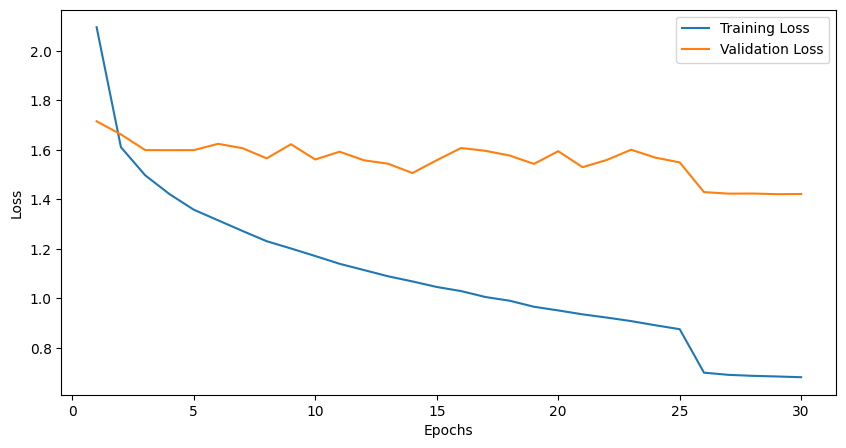

Checkpoint: model weights saved.


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(classifier.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')

train_model_features(
    classifier,
    train_loader_feat,
    test_loader_feat,
    criterion,
    optimizer,
    scheduler
)

# Save the resulting model onto google drive for later use
save_path = "/content/drive/MyDrive/DLProject/foodnet_weights_pre_fine_tune.pth"
torch.save(classifier.state_dict(), save_path)
print("Checkpoint: model weights saved.")

## This block defines utility functions for model evaluation, including an image unnormalization helper and a tool to visualize random predictions with their top-K probabilities. Additionally, it includes a testing function to calculate overall accuracy and collect predictions for further performance analysis.

In [ ]:
# Helper function to return a normalized image to a regular one
def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

# Randomly pick an image and use the model to evaluate it
def show_random_prediction(model, dataset, device, topk=3):
    model.eval()

    # Random image index
    idx = random.randint(0, len(dataset) - 1)
    image, true_label = dataset[idx]

    # Add batch dimension
    input_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probs, topk)

    # Convert to readable labels
    if isinstance(dataset, Subset):
        class_names = dataset.dataset.classes
    else:
        class_names = dataset.classes

    predictions = [(class_names[i], top_probs[0][j].item())
                   for j, i in enumerate(top_indices[0])]

    # Plot image
    plt.figure(figsize=(6, 6))
    plt.imshow(unnormalize(image))
    plt.axis("off")

    title = f"True: {class_names[true_label]}\n"
    title += "\n".join([f"Top-{i+1}: {name} ({prob:.2f})"
                         for i, (name, prob) in enumerate(predictions)])

    plt.title(title)
    plt.show()

# Test Model
def test_model(model, test_loader):
  correct = 0
  total = 0
  all_preds = []
  all_labels = []

  model.eval()
  with torch.no_grad():
      for inputs, labels in test_loader:
          inputs, labels = inputs.to(device), labels.to(device)
          outputs = model(inputs)
          _, predicted = torch.max(outputs.data, 1)
          total += labels.size(0)
          correct += (predicted == labels).sum().item()
          all_preds.extend(predicted.cpu().numpy())
          all_labels.extend(labels.cpu().numpy())
  return all_preds, all_labels

## This block updates the visualization function to handle the modular model structure, passing input images through the ResNet backbone before feeding the extracted features into the classifier. It facilitates real-time testing by displaying a random image alongside the model's top three class predictions and their associated confidence scores.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

from torch.utils.data import Subset

# Helper function to return a normalized image to a regular one
def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

# Modified show_random_prediction to include backbone for feature extraction
def show_random_prediction_classifier(backbone, classifier, dataset, device, topk=3):
    backbone.eval() # Ensure backbone is in evaluation mode
    classifier.eval() # Ensure classifier is in evaluation mode

    # Random image index
    idx = random.randint(0, len(dataset) - 1)
    image, true_label = dataset[idx]

    # Add batch dimension
    input_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        # Extract features using the backbone model
        features = backbone(input_tensor)
        # Flatten the features to match the input of the linear classifier
        features = features.view(features.size(0), -1)
        # Pass features to the classifier for prediction
        outputs = classifier(features)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probs, topk)

    # Convert to readable labels, handling Subset dataset correctly
    if isinstance(dataset, Subset):
        class_names = dataset.dataset.classes
    else:
        class_names = dataset.classes

    predictions = [(class_names[i], top_probs[0][j].item())
                   for j, i in enumerate(top_indices[0])]

    # Plot image
    plt.figure(figsize=(6, 6))
    plt.imshow(unnormalize(image))
    plt.axis("off")

    title = f"True: {class_names[true_label]}\n"
    title += "\n".join([f"Top-{i+1}: {name} ({prob:.2f})"
                         for i, (name, prob) in enumerate(predictions)])

    plt.title(title)
    plt.show()

# Call the modified function with both backbone and classifier
#show_random_prediction_classifier(backbone, classifier, test_dataset, device, topk=3)

## This cell evaluates the trained classifier by calculating key performance metrics, including accuracy, precision, recall, and F1 score. It also generates a confusion matrix heatmap to visualize the distribution of predictions across all 101 classes, helping to identify specific categories where the model might be confused.

Accuracy: 0.6510
Precision: 0.6526
Recall: 0.6510
F1 Score: 0.6495

Confusion Matrix:


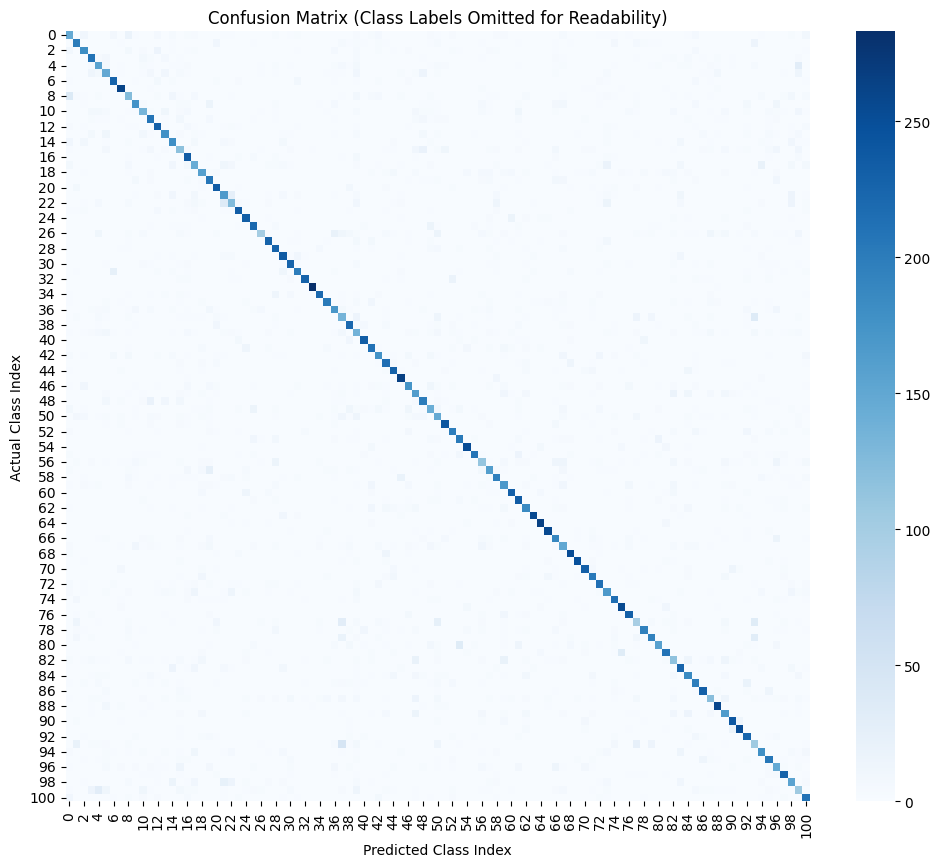

In [ ]:
all_preds, all_labels = test_model(classifier, test_loader_feat)

# Calculate model metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

# Print the models metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Create and dispaly a Confusion Matrix
print("\nConfusion Matrix:")
conf_mat = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(12,10)) # Increased figure size
sns.heatmap(conf_mat, annot=False, fmt='d', cmap='Blues') # Removed labels for readability, set annot=False
plt.ylabel('Actual Class Index')
plt.xlabel('Predicted Class Index')
plt.title('Confusion Matrix (Class Labels Omitted for Readability)')
plt.show()

## This block prepares the model for fine-tuning by loading the pre-trained classifier weights into a full ResNet-50 architecture. It selectively unfreezes the final convolutional block (layer4) and the fully connected layer, allowing high-level features to be refined while keeping the earlier layers fixed to preserve general visual knowledge.

In [ ]:
model = models.resnet50(pretrained=True)

# Replace FC
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Load trained classifier weights
model.fc.load_state_dict(torch.load("/content/drive/MyDrive/DLProject/foodnet_weights_pre_fine_tune.pth"))

# Freeze every layer
for param in model.parameters():
    param.requires_grad = False

# Unfreeze layer4 + FC
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5
)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## This cell executes the fine-tuning process, training the unfrozen layers of the full ResNet-50 model over 10 epochs. It tracks the loss progression with a visualization graph, according to the graph we can tell the model suffers from significant overfitting.

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 1/10, Train Loss: 1.3646, Val Loss: 1.5824, LR: 1e-05
Epoch 2/10, Train Loss: 0.8045, Val Loss: 1.4601, LR: 1e-05
Epoch 3/10, Train Loss: 0.5819, Val Loss: 1.4328, LR: 1e-05
Epoch 4/10, Train Loss: 0.4210, Val Loss: 1.4271, LR: 1e-05
Epoch 5/10, Train Loss: 0.2971, Val Loss: 1.4232, LR: 1e-05
Epoch 6/10, Train Loss: 0.2023, Val Loss: 1.4281, LR: 1e-05
Epoch 7/10, Train Loss: 0.1340, Val Loss: 1.4442, LR: 1e-05
Epoch 8/10, Train Loss: 0.0894, Val Loss: 1.4652, LR: 1e-05
Epoch 9/10, Train Loss: 0.0581, Val Loss: 1.4800, LR: 1e-05
Epoch 10/10, Train Loss: 0.0407, Val Loss: 1.4862, LR: 1e-05


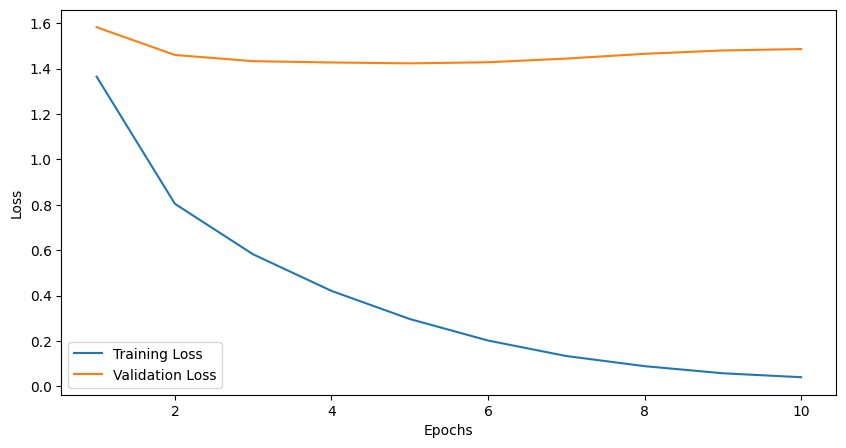

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=30):
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
    running_loss = 0.0
    model.train()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()         # Reset gradients
        outputs = model(inputs)        # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()                # Backpropagation
        optimizer.step()              # Update weights
        running_loss += loss.item()

    # Validation
    train_loss = running_loss/len(train_loader)
    train_losses.append(train_loss)
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
    val_loss = val_loss/len(test_loader)
    val_losses.append(val_loss)
    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']}")

  torch.save(model.state_dict(), "model_weights.pth")

  plt.figure(figsize=(10,5))
  plt.plot(range(1, int(num_epochs)+1), train_losses, label='Training Loss')
  plt.plot(range(1, int(num_epochs)+1), val_losses, label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()


save_path = "/content/drive/MyDrive/DLProject/foodnet_weights_post_fine_tune.pth"
train_model(model, criterion, optimizer, scheduler, num_epochs=10)
torch.save(model.state_dict(), save_path)

## This block performs an evaluation of the fine-tuned model, generating visual samples of predictions and calculating comprehensive performance metrics. It concludes with a high-resolution confusion matrix to verify if the fine-tuning process successfully improved the classification accuracy across the 101 food categories, from these metrics we can tell that this current model is insufficient.

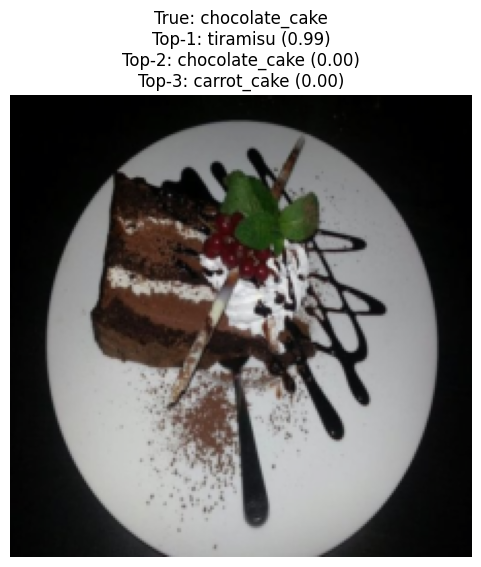

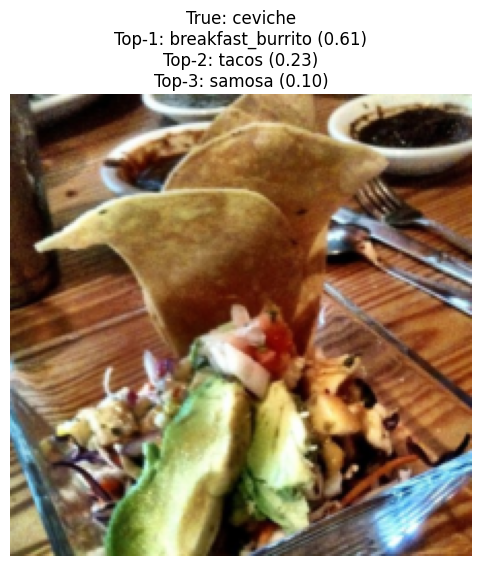

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Accuracy: 0.6786
Precision: 0.6780
Recall: 0.6786
F1 Score: 0.6775

Confusion Matrix:


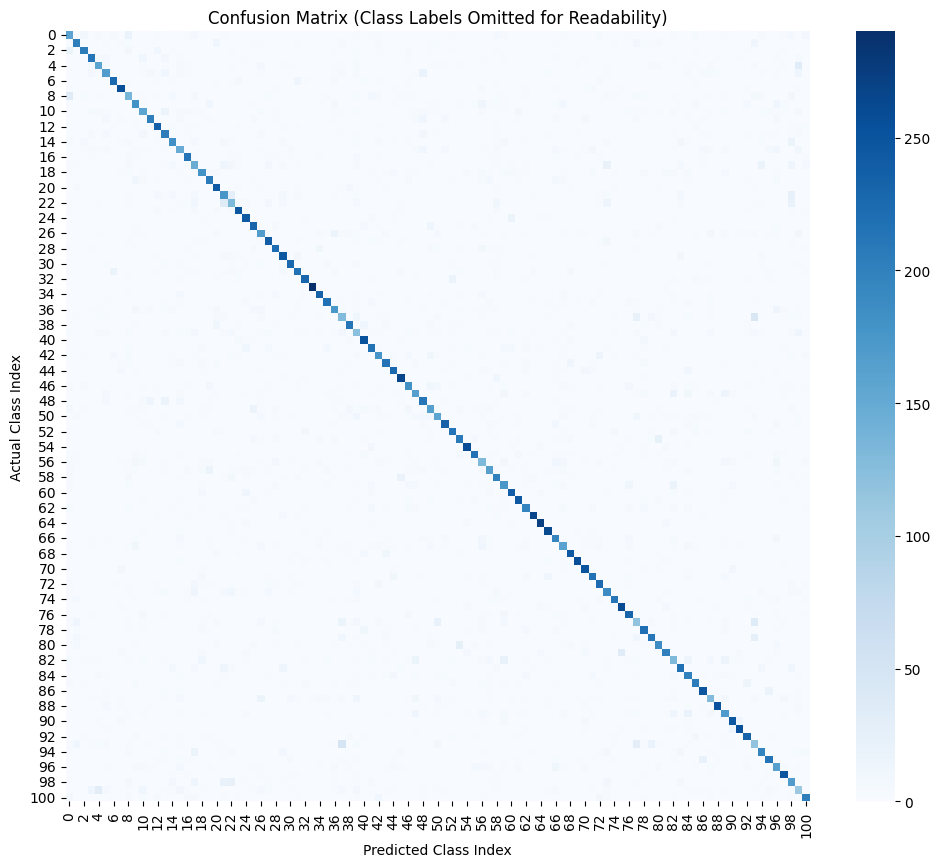

In [ ]:
show_random_prediction(model, test_dataset, device=device)
show_random_prediction(model, test_dataset, device=device)

all_preds, all_labels = test_model(model, test_loader)

# Calculate model metrics
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

# Print the models metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Create and dispaly a Confusion Matrix
print("\nConfusion Matrix:")
conf_mat = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(12,10)) # Increased figure size
sns.heatmap(conf_mat, annot=False, fmt='d', cmap='Blues') # Removed labels for readability, set annot=False
plt.ylabel('Actual Class Index')
plt.xlabel('Predicted Class Index')
plt.title('Confusion Matrix (Class Labels Omitted for Readability)')
plt.show()



## This block re-initializes the training process with the newly applied data augmentations and L2 regularization to further combat overfitting. By running the training for 100 epochs, the model leverages the increased diversity in the training data to learn more robust features, aiming for a more stable convergence between training and validation loss. We can see from the resulting graph that overfitting still exists, which fine-tuning should solve.

Epoch 1/100 | Train 2.0919 | Val 1.7918
Epoch 2/100 | Train 1.6150 | Val 1.6555
Epoch 3/100 | Train 1.4991 | Val 1.6070
Epoch 4/100 | Train 1.4259 | Val 1.6219
Epoch 5/100 | Train 1.3753 | Val 1.5656
Epoch 6/100 | Train 1.3304 | Val 1.5528
Epoch 7/100 | Train 1.2914 | Val 1.5408
Epoch 8/100 | Train 1.2581 | Val 1.5752
Epoch 9/100 | Train 1.2310 | Val 1.6162
Epoch 10/100 | Train 1.2053 | Val 1.5521
Epoch 11/100 | Train 1.1818 | Val 1.5441
Epoch 12/100 | Train 1.1673 | Val 1.5589
Epoch 13/100 | Train 1.1459 | Val 1.5570
Epoch 14/100 | Train 1.1261 | Val 1.5523
Epoch 15/100 | Train 1.1089 | Val 1.5497
Epoch 16/100 | Train 1.0960 | Val 1.5243
Epoch 17/100 | Train 1.0787 | Val 1.5262
Epoch 18/100 | Train 1.0662 | Val 1.5094
Epoch 19/100 | Train 1.0562 | Val 1.5470
Epoch 20/100 | Train 1.0508 | Val 1.5131
Epoch 21/100 | Train 1.0366 | Val 1.5113
Epoch 22/100 | Train 1.0263 | Val 1.5490
Epoch 23/100 | Train 1.0171 | Val 1.4848
Epoch 24/100 | Train 1.0085 | Val 1.5066
Epoch 25/100 | Train 1.00

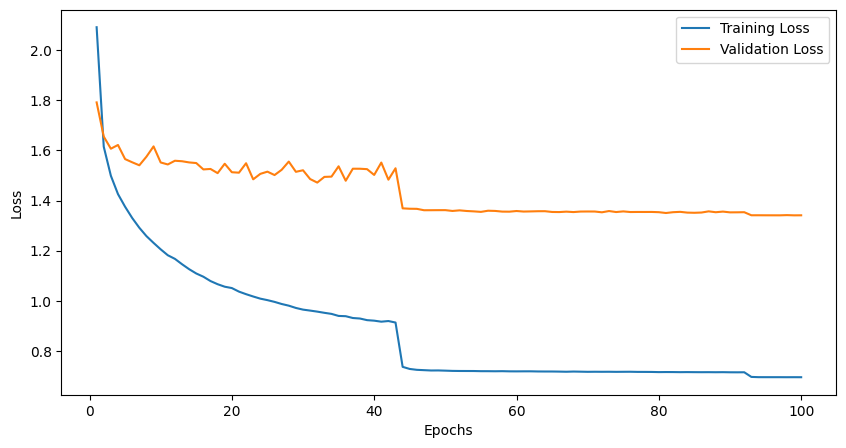

In [ ]:
# Set up new transformation to improve modal generalization
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),   # slightly larger crop range
    transforms.RandomHorizontalFlip(),                      # horizontal flip
    transforms.RandomVerticalFlip(p=0.2),                  # small chance of vertical flip
    transforms.RandomRotation(15),                          # slightly bigger rotation
    transforms.ColorJitter(
        brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05
    ),                                                     # more color variation
    transforms.RandomAffine(
        degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=5
    ),                                                     # shift, scale, shear
    transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 2.0)),  # small blur
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Recreate the train and test datasets using the indices
from torch.utils.data import Subset
train_dataset = Subset(dataset, train_idx)
test_dataset = Subset(dataset, test_idx)

# Give the train and test datasets the correct transformations and create the loaders for training
train_dataset.dataset.transform = train_transform
test_dataset.dataset.transform = base_transform

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)

# Run the backbone once and set up the resulting features
train_features, train_labels = extract_features(backbone, train_loader)
test_features, test_labels = extract_features(backbone, test_loader)

# Set up the final dataset and loaders for feature extraction
train_feature_dataset = FeatureDataset(train_features, train_labels)
test_feature_dataset = FeatureDataset(test_features, test_labels)

train_loader_feat = DataLoader(train_feature_dataset, batch_size=64, shuffle=True)
test_loader_feat = DataLoader(test_feature_dataset, batch_size=64, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
classifier = nn.Linear(2048, num_classes).to(device)

# Set up new Feature extraction
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, classifier.parameters()),  # only trainable params
    lr=0.001,
    weight_decay=1e-4  # L2 regularization
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')

# Extract model features again
train_model_features(classifier, train_loader_feat, test_loader_feat, criterion, optimizer, scheduler, num_epochs=100)

In [ ]:
save_path = "foodnet_weights_pre_fine_tune.pth"
torch.save(classifier.state_dict(), save_path)
print("Checkpoint: model weights saved.")

Checkpoint: model weights saved.


## This block introduces an enhanced training function designed for persistent model checkpointing. By creating a dedicated directory and saving the state dictionary at the conclusion of every epoch, it ensures that progress is preserved and allows for the retrospective selection of the optimal weight set based on the returned validation loss history.

In [ ]:
import os
# Create folder to save weights each epoch
saved_weights_dir = "./fine_tune_train"
os.makedirs(saved_weights_dir, exist_ok=True)

save_template = "fine_tune_train/epoch_num_"

# We will modify the train model function specifically to save weights each epoch
def train_model(model, criterion, optimizer, scheduler, num_epochs=30):
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
    running_loss = 0.0
    model.train()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()         # Reset gradients
        outputs = model(inputs)        # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()                # Backpropagation
        optimizer.step()              # Update weights
        running_loss += loss.item()

    # Validation
    train_loss = running_loss/len(train_loader)
    train_losses.append(train_loss)
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
    val_loss = val_loss/len(test_loader)
    val_losses.append(val_loss)
    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']}")
    # Added saving weights each epoch
    save_path = save_template + str(epoch + 1) + ".pth"
    torch.save(model.state_dict(), save_path)

  plt.figure(figsize=(10,5))
  plt.plot(range(1, int(num_epochs)+1), train_losses, label='Training Loss')
  plt.plot(range(1, int(num_epochs)+1), val_losses, label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()
  # Added return to send losses so we can automate picking the best epoch weights
  return val_losses


## This block refines the fine-tuning strategy by introducing additional regularization techniques to combat overfitting. It wraps the final linear layer in a Sequential container with a Dropout layer ($p=0.4$) and implements Label Smoothing ($0.1$) within the Cross-Entropy Loss function. By combining these with a weight decay in the Adam optimizer, the model is encouraged to generalize better across the 101 food categories during the final training phase.

In [ ]:
model = models.resnet50(pretrained=True)

# Replace FC with a modified version to reduce overfitting
modified_classifier = nn.Sequential(
    nn.Dropout(0.4), # Add light dropout to the final layer to reduce overfitting
    nn.Linear(model.fc.in_features, num_classes)
).to(device)

# Load trained classifier weights
save_path = "foodnet_weights_pre_fine_tune.pth"
modified_classifier[1].load_state_dict(torch.load(save_path))

# Attach the modified layer to ResNet
model.fc = modified_classifier

# Freeze every layer
for param in model.parameters():
    param.requires_grad = False

# Unfreeze layer4 + FC
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5, weight_decay=1e-4
)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3)

## This block executes the final two-stage fine-tuning process to squeeze out maximum performance while preventing catastrophic forgetting. It first runs 10 epochs of training, automatically identifies the best performing checkpoint based on the lowest validation loss, and then re-runs a secondary fine-tuning phase with a significantly smaller learning rate ($3 \times 10^{-6}$). We can see from the result that the first fine-tuning round resulted in a model with larger loss than before, yet significantly less overfitting. The second round of fine-tuning only reintroduced overfitting, and thus the weights of that round were discarded.

Epoch 1/10, Train Loss: 4.1637, Val Loss: 2.4665, LR: 1e-05
Epoch 2/10, Train Loss: 2.9953, Val Loss: 2.0430, LR: 1e-05
Epoch 3/10, Train Loss: 2.5181, Val Loss: 1.9628, LR: 1e-05
Epoch 4/10, Train Loss: 2.2811, Val Loss: 1.9094, LR: 1e-05
Epoch 5/10, Train Loss: 2.1099, Val Loss: 1.8696, LR: 1e-05
Epoch 6/10, Train Loss: 1.9632, Val Loss: 1.8470, LR: 1e-05
Epoch 7/10, Train Loss: 1.8391, Val Loss: 1.8243, LR: 1e-05
Epoch 8/10, Train Loss: 1.7320, Val Loss: 1.8180, LR: 1e-05
Epoch 9/10, Train Loss: 1.6324, Val Loss: 1.8086, LR: 1e-05
Epoch 10/10, Train Loss: 1.5408, Val Loss: 1.8031, LR: 1e-05


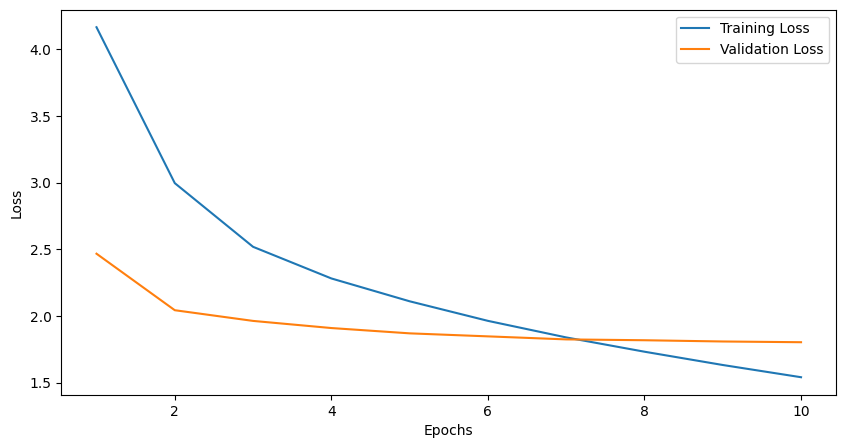


Best epoch found: 10 | Val Loss: 1.8031
Loading best weights from: fine_tune_train/epoch_num_10.pth
Epoch 1/10, Train Loss: 1.4470, Val Loss: 1.8079, LR: 3e-06
Epoch 2/10, Train Loss: 1.4161, Val Loss: 1.8127, LR: 3e-06
Epoch 3/10, Train Loss: 1.3920, Val Loss: 1.8080, LR: 3e-06
Epoch 4/10, Train Loss: 1.3643, Val Loss: 1.8082, LR: 3e-06
Epoch 5/10, Train Loss: 1.3426, Val Loss: 1.8171, LR: 3e-06
Epoch 6/10, Train Loss: 1.3193, Val Loss: 1.8220, LR: 3e-06
Epoch 7/10, Train Loss: 1.2992, Val Loss: 1.8238, LR: 3e-06
Epoch 8/10, Train Loss: 1.2784, Val Loss: 1.8330, LR: 3e-06
Epoch 9/10, Train Loss: 1.2602, Val Loss: 1.8307, LR: 3e-06
Epoch 10/10, Train Loss: 1.2423, Val Loss: 1.8346, LR: 3e-06


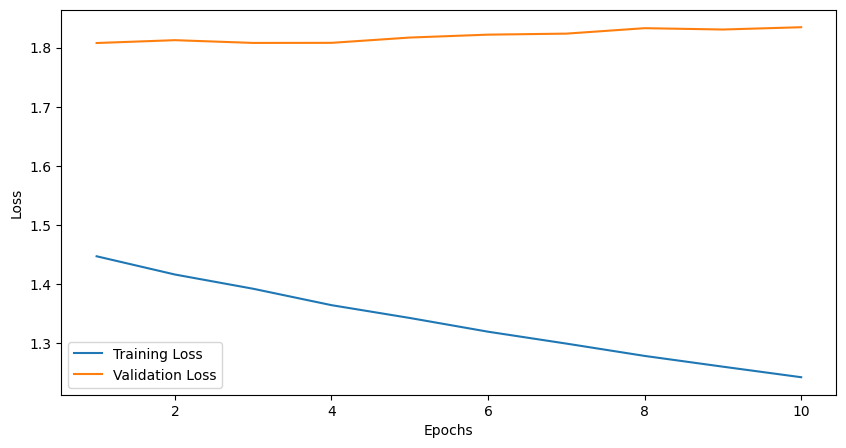


Best epoch found: 1 | Val Loss: 1.8079


In [ ]:
# Fine-tune the model
losses = train_model(model, criterion, optimizer, scheduler, num_epochs=10)

# Pick the weights with the lowest validation loss
best_epoch = min(range(len(losses)), key=lambda i: losses[i]) + 1
best_loss = losses[best_epoch - 1]

print(f"\nBest epoch found: {best_epoch} | Val Loss: {best_loss:.4f}")

# Load the correct weights onto the model
best_weights_path = save_template + str(best_epoch) + ".pth"
print(f"Loading best weights from: {best_weights_path}")
model.load_state_dict(torch.load(best_weights_path))

# Make sure model is loaded onto device
model = model.to(device)

# Pick smaller learning rate
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=3e-6, weight_decay=1e-4
)

# Fine-tune furthur with a smaller learning rate
losses = train_model(model, criterion, optimizer, scheduler, num_epochs=10)

best_epoch = min(range(len(losses)), key=lambda i: losses[i]) + 1
best_loss = losses[best_epoch - 1]
print(f"\nBest epoch found: {best_epoch} | Val Loss: {best_loss:.4f}")

## This block defines a robust evaluation suite that goes beyond standard accuracy to provide a deep dive into model performance. The evaluate_model function calculates Top-1 and Top-3 accuracy, generates a detailed classification report (including precision, recall, and F1-score per class), and produces a refined confusion matrix. To maintain readability across 101 categories, the heatmap specifically isolates the top misclassified classes, allowing for targeted analysis of where the model struggles most.

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import torch

def evaluate_model(model, dataloader, device, topk=(1,3), class_names=None, top_misclasses=20):
    model.eval()
    correct_top1 = 0
    correct_top3 = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            # Top-k accuracy
            _, pred_topk = outputs.topk(max(topk), dim=1, largest=True, sorted=True)
            total += labels.size(0)
            correct_top1 += (pred_topk[:,0] == labels).sum().item()
            correct_top3 += sum([labels[i] in pred_topk[i,:3] for i in range(labels.size(0))])

            # Store all predictions and labels for metrics
            all_preds.extend(pred_topk[:,0].cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    top1_acc = correct_top1 / total
    top3_acc = correct_top3 / total

    # Metrics
    precision_macro = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    recall_macro = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    f1_macro = f1_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"\n===== MODEL EVALUATION =====")
    print(f"Top-1 Accuracy: {top1_acc:.4f}")
    print(f"Top-3 Accuracy: {top3_acc:.4f}")
    print(f"\n--- Precision ---\nMacro:    {precision_macro:.4f}")
    print(f"\n--- Recall ---\nMacro:    {recall_macro:.4f}")
    print(f"\n--- F1 Score ---\nMacro:    {f1_macro:.4f}\n")

    print("===== CLASSIFICATION REPORT =====")
    print(classification_report(all_labels, all_preds, target_names=class_names, zero_division=0))

    # Confusion Matrix
    conf_mat = confusion_matrix(all_labels, all_preds)

    # Find top misclassified classes
    misclass_counts = conf_mat.sum(axis=1) - np.diag(conf_mat)  # total errors per class
    top_indices = np.argsort(misclass_counts)[-top_misclasses:]  # top misclassified classes

    conf_mat_top = conf_mat[np.ix_(top_indices, top_indices)]
    top_class_names = [class_names[i] if class_names is not None else str(i) for i in top_indices]

    print("\nConfusion Matrix (Top Misclassified Classes):")
    plt.figure(figsize=(12,10))
    sns.heatmap(conf_mat_top, annot=True, fmt='d', cmap='Blues',
                xticklabels=top_class_names, yticklabels=top_class_names)
    plt.ylabel('Actual Class')
    plt.xlabel('Predicted Class')
    plt.title('Confusion Matrix (Top Misclassified Classes)')
    plt.show()

    return top1_acc, top3_acc, precision_macro, recall_macro, f1_macro, conf_mat


## This block initializes and prepares both the Feature Extraction and Fine-Tuned versions of the model for a final head-to-head comparison. It re-assembles the ResNet-50 architectures, carefully mapping the previously saved weights to their respective components—specifically the linear classifier for the feature-based model and the dropout-inclusive sequential head for the fine-tuned model. Setting both to .eval() mode ensures consistent behavior by freezing batch normalization and dropout layers during the upcoming performance evaluation.

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

# --- FEATURE EXTRACTION MODEL ---
feature_model = models.resnet50(pretrained=True)

classifier = nn.Linear(feature_model.fc.in_features, num_classes)

# Load trained classifier weights
classifier.load_state_dict(
    torch.load("foodnet_weights_pre_fine_tune.pth", map_location=device)
)

# Attach classifier
feature_model.fc = classifier
feature_model.to(device)
feature_model.eval()  # important for evaluation


# --- FINE-TUNED MODEL ---
fine_tune_model = models.resnet50(pretrained=True)

modified_classifier = nn.Sequential(
    nn.Dropout(0.4),
    nn.Linear(fine_tune_model.fc.in_features, num_classes)
)

fine_tune_model.fc = modified_classifier

# Load full fine-tuned weights, the weights we chose are those of the last epoch before switching to a lower lr because it had the best results
fine_tune_model.load_state_dict(
    torch.load("epoch_num_10_backup.pth", map_location=device)
)

fine_tune_model.to(device)
fine_tune_model.eval()

c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## This block executes a side-by-side performance evaluation of the two modeling strategies: the initial Feature Extraction approach and the progressively optimized Fine-Tuning approach. By leveraging the comprehensive evaluate_model function, it generates comparative metrics for Top-1 and Top-3 accuracy, F1-scores, and identifies specific class-level confusion for both models, We can tell from the comparison that the fine-tuned model is significantly better than the simple feature extracted one.

=== Feature Extraction Model ===

===== MODEL EVALUATION =====
Top-1 Accuracy: 0.6585
Top-3 Accuracy: 0.8186

--- Precision ---
Macro:    0.6561

--- Recall ---
Macro:    0.6585

--- F1 Score ---
Macro:    0.6567

===== CLASSIFICATION REPORT =====
              precision    recall  f1-score   support

           0       0.50      0.46      0.48       300
           1       0.66      0.67      0.66       300
           2       0.63      0.62      0.62       300
           3       0.67      0.70      0.69       300
           4       0.52      0.50      0.51       300
           5       0.49      0.49      0.49       300
           6       0.77      0.76      0.76       300
           7       0.79      0.85      0.82       300
           8       0.45      0.43      0.44       300
           9       0.70      0.60      0.65       300
          10       0.53      0.48      0.50       300
          11       0.69      0.65      0.67       300
          12       0.72      0.76      0.74      

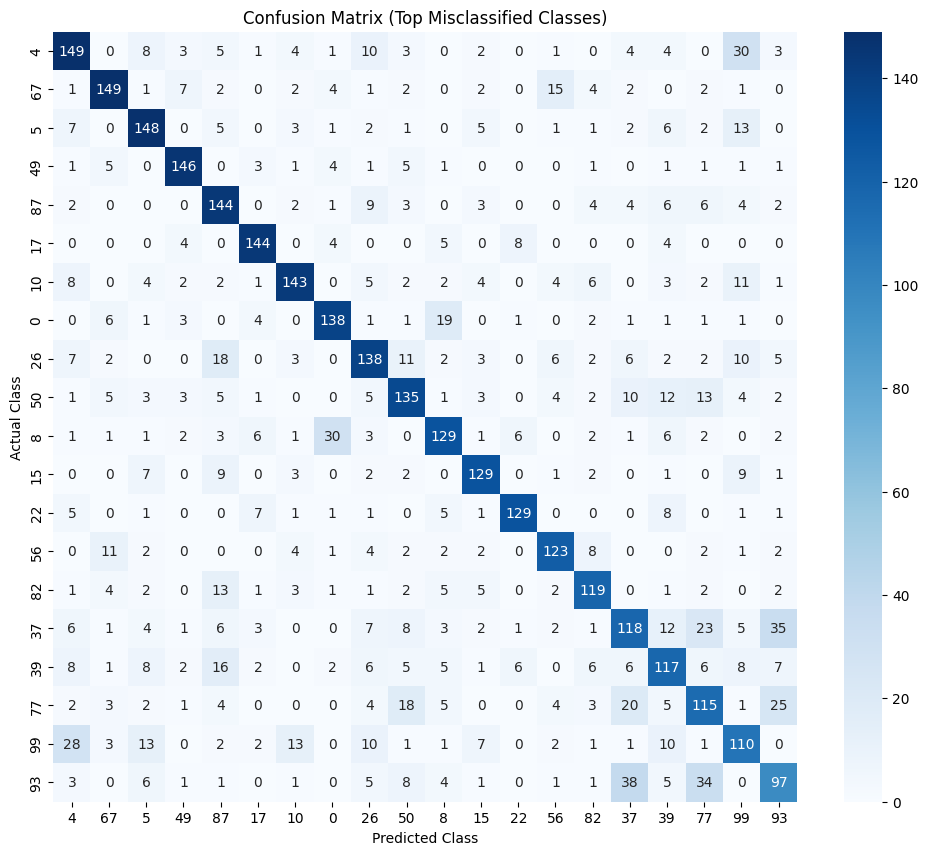


=== Fine Tuned Model ===

===== MODEL EVALUATION =====
Top-1 Accuracy: 0.7252
Top-3 Accuracy: 0.8632

--- Precision ---
Macro:    0.7247

--- Recall ---
Macro:    0.7252

--- F1 Score ---
Macro:    0.7236

===== CLASSIFICATION REPORT =====
              precision    recall  f1-score   support

           0       0.52      0.56      0.54       300
           1       0.70      0.76      0.73       300
           2       0.74      0.77      0.76       300
           3       0.76      0.77      0.76       300
           4       0.67      0.65      0.66       300
           5       0.60      0.63      0.61       300
           6       0.80      0.82      0.81       300
           7       0.82      0.86      0.84       300
           8       0.54      0.51      0.53       300
           9       0.66      0.69      0.68       300
          10       0.62      0.56      0.59       300
          11       0.70      0.79      0.75       300
          12       0.80      0.79      0.80       300
  

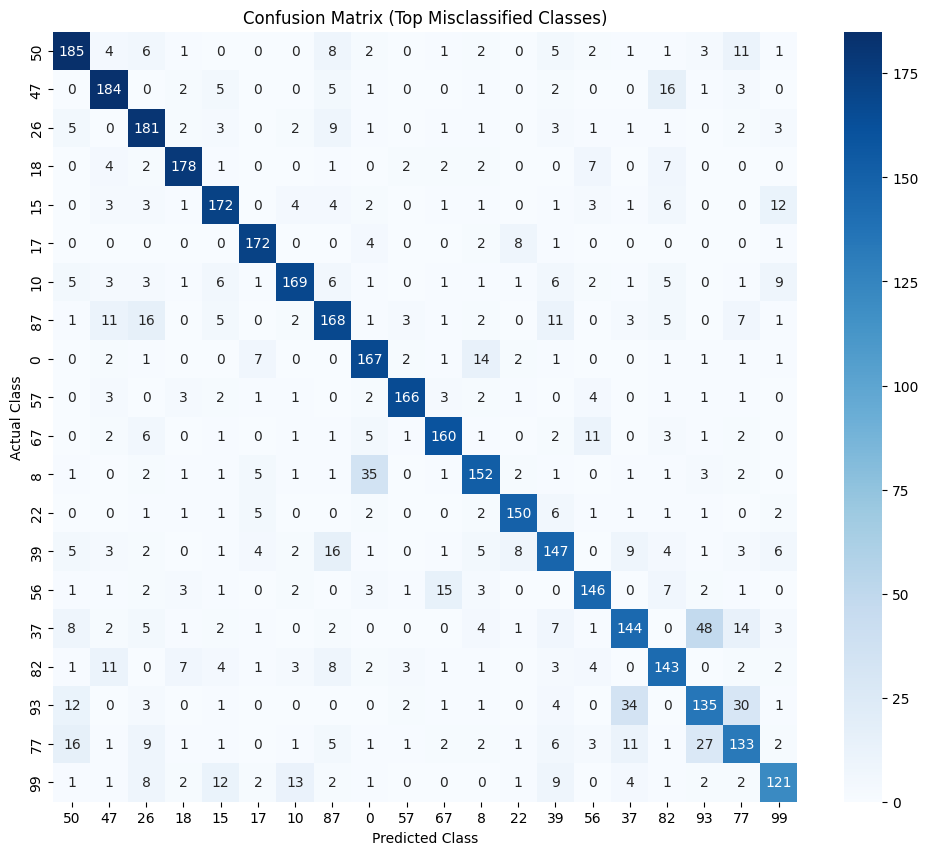

(0.7252475247524752,
 0.8631683168316832,
 0.72467331163105,
 0.7252475247524753,
 0.7235782530761052,
 array([[167,   0,  15, ...,   3,   1,   7],
        [  0, 227,   1, ...,   0,   0,   0],
        [  8,   0, 232, ...,   0,   0,   0],
        ...,
        [  1,   0,   4, ..., 186,   0,   1],
        [  1,   0,   2, ...,   1, 121,   0],
        [  8,   1,   0, ...,   1,   1, 205]], shape=(101, 101)))

In [ ]:
print("=== Feature Extraction Model ===")
evaluate_model(feature_model, test_loader, device)

print("\n=== Fine Tuned Model ===")
evaluate_model(fine_tune_model, test_loader, device)

## These visual tests demonstrate the Fine-Tuned Model's ability to generalize across the Food-101 dataset. By refining the weights of the upper convolutional layers, the model has improved its generalization significantly, yet there is still room for improvement.

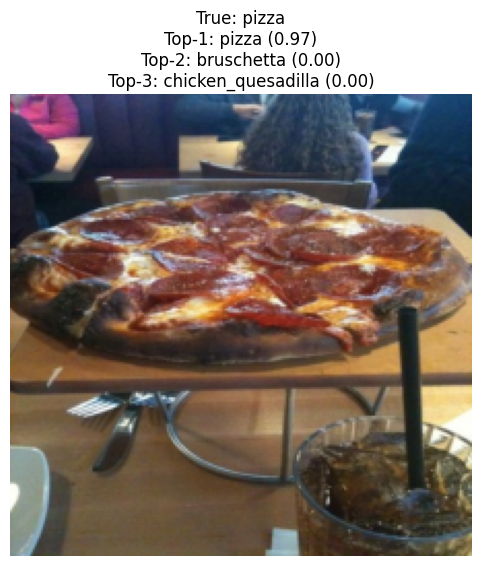

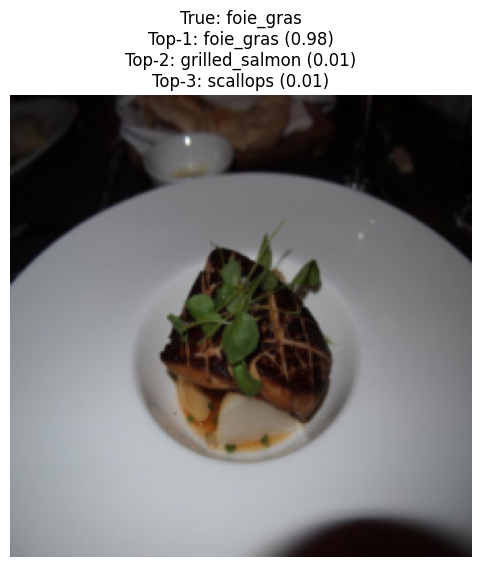

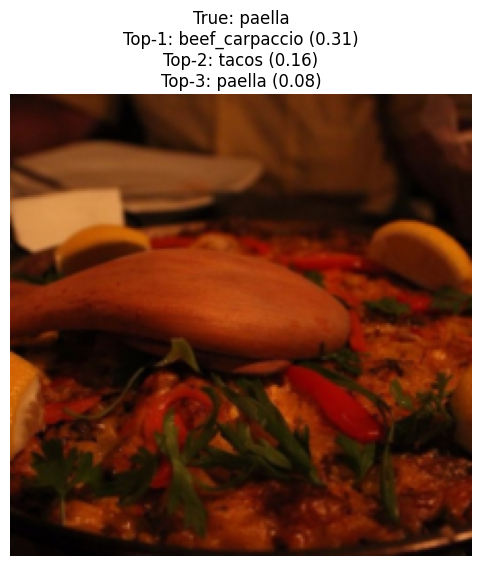

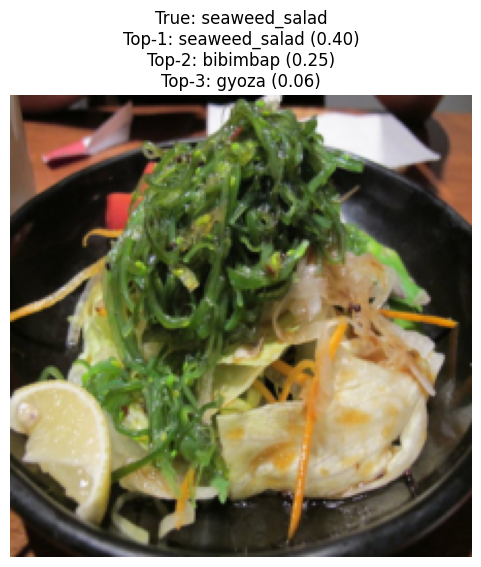

In [ ]:
show_random_prediction(fine_tune_model, test_dataset, device=device)
show_random_prediction(fine_tune_model, test_dataset, device=device)
show_random_prediction(fine_tune_model, test_dataset, device=device)
show_random_prediction(fine_tune_model, test_dataset, device=device)

## This final block introduces a utility function, show_examples, designed to pull and display representative samples from specific categories within the training dataset. By visualizing classes that the model frequently confuses—such as various meat dishes (steak vs. pork chop) or visually similar desserts—you can better understand the "why" behind the misclassifications seen in the confusion matrix.

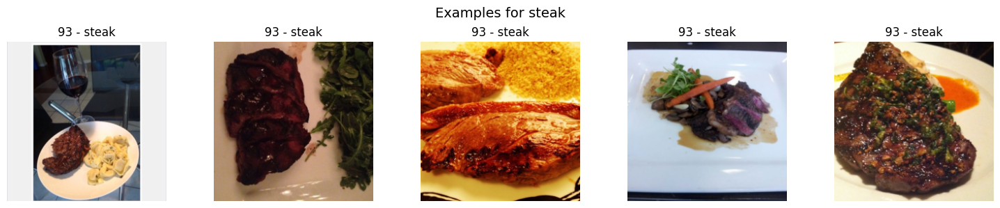

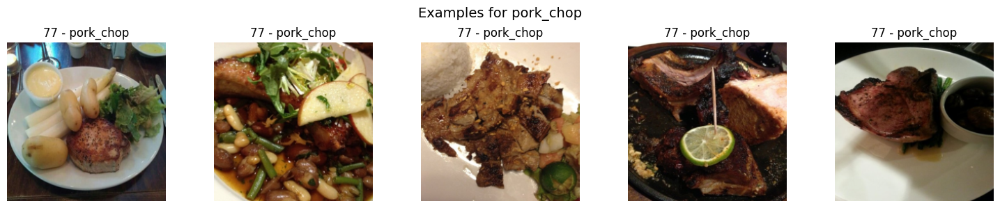

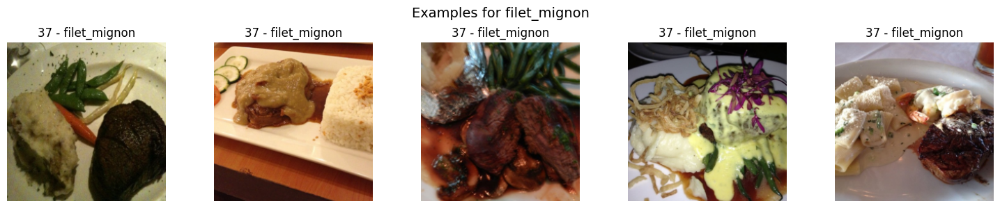

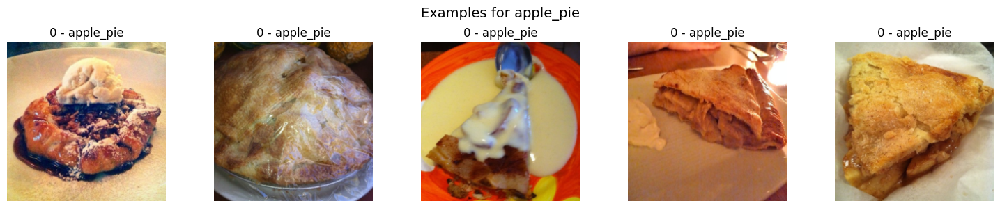

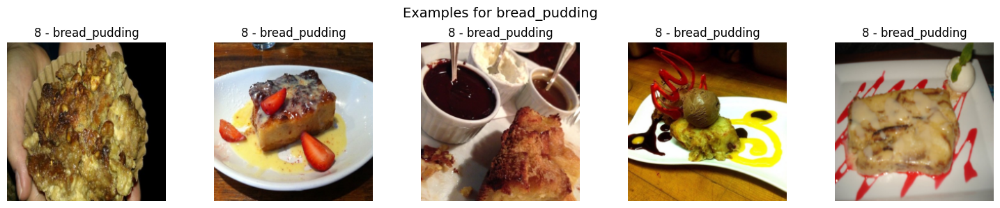

In [ ]:
import matplotlib.pyplot as plt
from collections import defaultdict

def show_examples(dataset, class_indices, class_names=None, num_examples=5):
    # 1. Efficiently gather images in a single pass
    examples = defaultdict(list)
    targets = set(class_indices)

    for img, label in dataset:
        # Convert tensor label to int if necessary
        label_id = int(label)

        if label_id in targets and len(examples[label_id]) < num_examples:
            examples[label_id].append(img)

        # Optimization: Stop early if we have enough examples for all classes
        if all(len(examples[cls]) >= num_examples for cls in targets):
            break

    # 2. Display the gathered images
    for cls in class_indices:
        imgs = examples.get(cls, [])
        if not imgs:
            print(f"No examples found for Class {cls}")
            continue

        plt.figure(figsize=(15, 3))
        # Get the name from dictionary or default to "Unknown"
        name = class_names.get(cls, "Unknown") if class_names else ""

        for i, img in enumerate(imgs):
            plt.subplot(1, num_examples, i + 1)
            plt.imshow(unnormalize(img))
            plt.title(f"{cls} - {name}" if name else f"Class {cls}")
            plt.axis('off')

        plt.suptitle(f"Examples for {name}", fontsize=14)
        plt.tight_layout()
        plt.show()

# Example usage:
# Map your numbers back to the strings
class_map = dict((num, name) for num, name in enumerate(dataset.classes))

show_examples(train_dataset, [93, 77, 37, 0, 8], class_names=class_map)

## This block aggressive extends the fine-tuning strategy by unfreezing both layer3 and layer4 of the ResNet-50 architecture. By opening up more of the convolutional backbone, the model can adapt lower-level visual features specifically to the complexities of the food dataset. To manage the increased risk of overfitting from this larger trainable parameter space, the block maintains the Dropout (0.4) layer, Weight Decay, and Label Smoothing ($0.1$) to ensure the optimization remains stable and generalizes well to the validation data.

In [ ]:
model = models.resnet50(pretrained=True)

# Replace FC with a modified version to reduce overfitting
modified_classifier = nn.Sequential(
    nn.Dropout(0.4), # Add light dropout to the final layer to reduce overfitting
    nn.Linear(model.fc.in_features, num_classes)
).to(device)

# Load trained classifier weights
save_path = "foodnet_weights_pre_fine_tune.pth"
modified_classifier[1].load_state_dict(torch.load(save_path))

# Attach the modified layer to ResNet
model.fc = modified_classifier

# Freeze every layer
for param in model.parameters():
    param.requires_grad = False

# Unfreeze layer4 + layer3 + FC
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.layer3.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

model = model.to(device)

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5, weight_decay=1e-4
)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3)

c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## This block executes the expanded fine-tuning process with both layer3 and layer4 unfrozen for 15 epochs. Opening up these deeper layers allows the model to better adapt to complex food textures, as seen in the training logs where the validation loss reached its minimum at epoch 8 with a value of 1.7223. After this point, while training loss continued to drop, validation loss began to plateau and slightly rise, indicating the onset of overfitting despite the dropout and label smoothing measures.

Epoch 1/15, Train Loss: 3.7132, Val Loss: 2.0413, LR: 1e-05
Epoch 2/15, Train Loss: 2.4226, Val Loss: 1.9030, LR: 1e-05
Epoch 3/15, Train Loss: 2.1069, Val Loss: 1.8262, LR: 1e-05
Epoch 4/15, Train Loss: 1.9061, Val Loss: 1.7750, LR: 1e-05
Epoch 5/15, Train Loss: 1.7508, Val Loss: 1.7463, LR: 1e-05
Epoch 6/15, Train Loss: 1.6099, Val Loss: 1.7248, LR: 1e-05
Epoch 7/15, Train Loss: 1.4889, Val Loss: 1.7225, LR: 1e-05
Epoch 8/15, Train Loss: 1.3822, Val Loss: 1.7223, LR: 1e-05
Epoch 9/15, Train Loss: 1.2873, Val Loss: 1.7275, LR: 1e-05
Epoch 10/15, Train Loss: 1.2100, Val Loss: 1.7414, LR: 1e-05
Epoch 11/15, Train Loss: 1.1421, Val Loss: 1.7376, LR: 1e-05
Epoch 12/15, Train Loss: 1.0900, Val Loss: 1.7481, LR: 1.0000000000000002e-06
Epoch 13/15, Train Loss: 1.0334, Val Loss: 1.7399, LR: 1.0000000000000002e-06
Epoch 14/15, Train Loss: 1.0229, Val Loss: 1.7415, LR: 1.0000000000000002e-06
Epoch 15/15, Train Loss: 1.0150, Val Loss: 1.7413, LR: 1.0000000000000002e-06


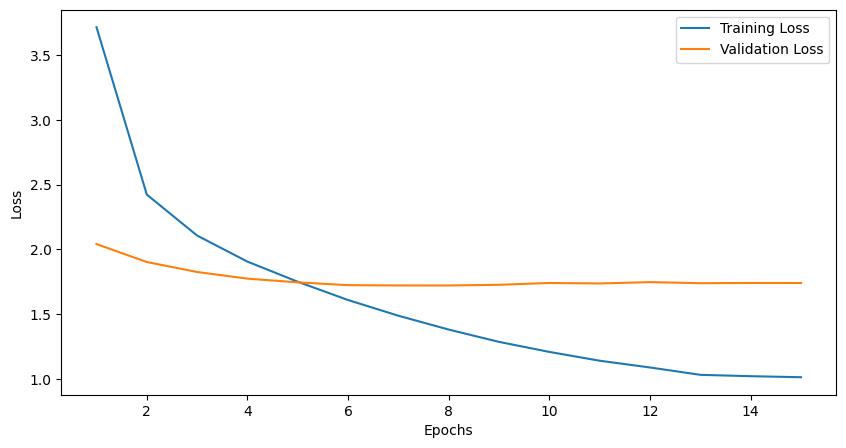


Best epoch found: 8 | Val Loss: 1.7223


In [ ]:
# Fine-tune with layer 3 and 4 unfrozen
losses = train_model(model, criterion, optimizer, scheduler, num_epochs=15)

best_epoch = min(range(len(losses)), key=lambda i: losses[i]) + 1
best_loss = losses[best_epoch - 1]
print(f"\nBest epoch found: {best_epoch} | Val Loss: {best_loss:.4f}")

## This section loads the saved weights from the eighth training epoch to evaluate the model's final performance on the test dataset. The resulting classification report and confusion matrix indicate a Top-1 accuracy of 74.52%, with specific insights into which food categories the model distinguishes effectively and where it tends to misclassify similar items.


===== MODEL EVALUATION =====
Top-1 Accuracy: 0.7452
Top-3 Accuracy: 0.8775

--- Precision ---
Macro:    0.7462

--- Recall ---
Macro:    0.7452

--- F1 Score ---
Macro:    0.7444

===== CLASSIFICATION REPORT =====
              precision    recall  f1-score   support

           0       0.51      0.55      0.53       300
           1       0.71      0.75      0.73       300
           2       0.79      0.77      0.78       300
           3       0.73      0.80      0.77       300
           4       0.72      0.66      0.69       300
           5       0.58      0.66      0.61       300
           6       0.82      0.82      0.82       300
           7       0.87      0.88      0.88       300
           8       0.60      0.56      0.58       300
           9       0.76      0.69      0.72       300
          10       0.66      0.61      0.64       300
          11       0.78      0.79      0.78       300
          12       0.84      0.83      0.83       300
          13       0.69     

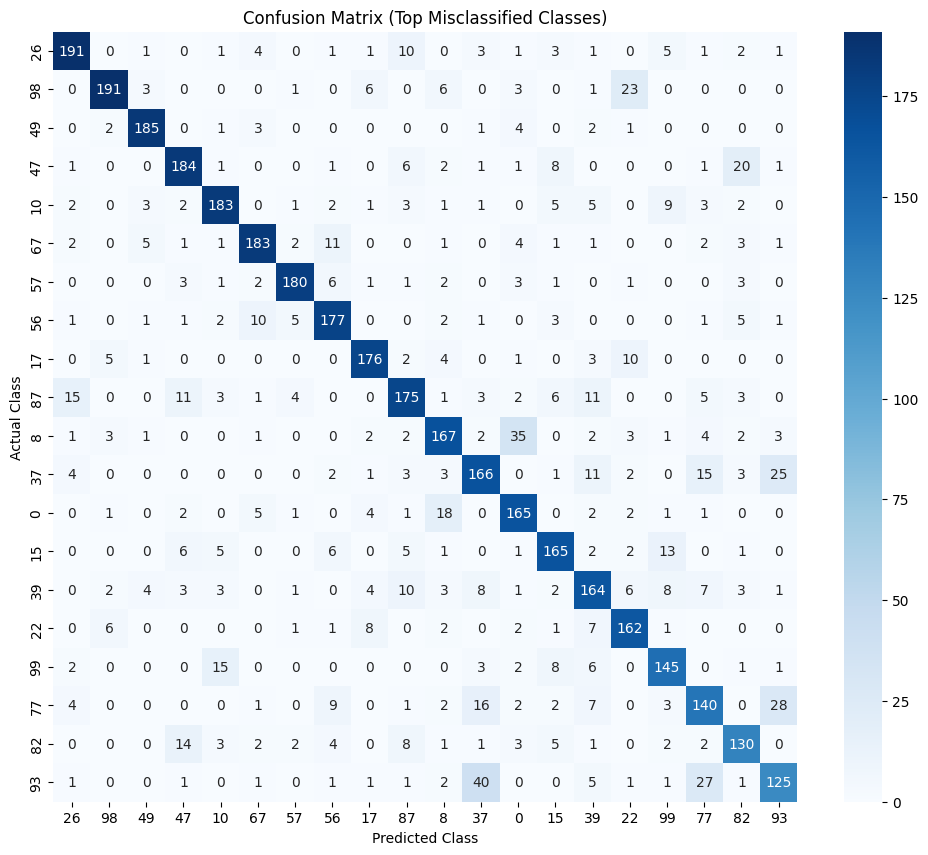

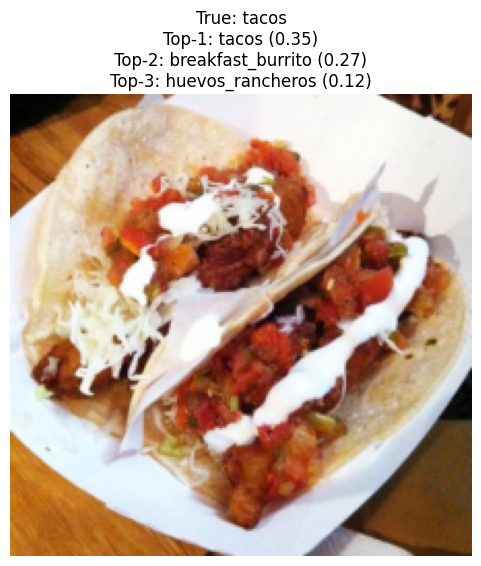

In [ ]:
# Reload the weights for epoch number 8 and test it
model.load_state_dict(torch.load("epoch_num_8_backup.pth", map_location=device))
model.eval()

evaluate_model(model, test_loader, device)
show_random_prediction(model, test_dataset, device)

## This section displays representative images from the dataset for seven distinct food categories, including ravioli, gnocchi, and tiramisu, to provide a visual reference for the model's training data. These examples highlight the similarities between the specific classes, and explains why the model confuses between them.

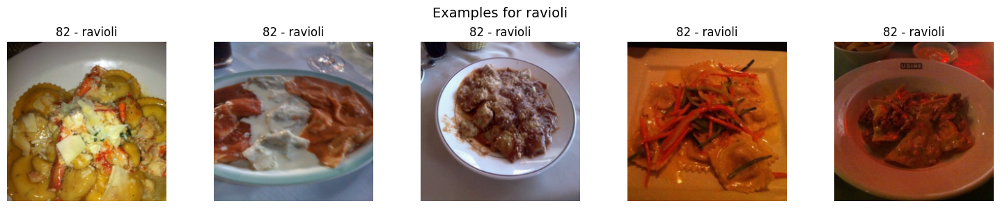

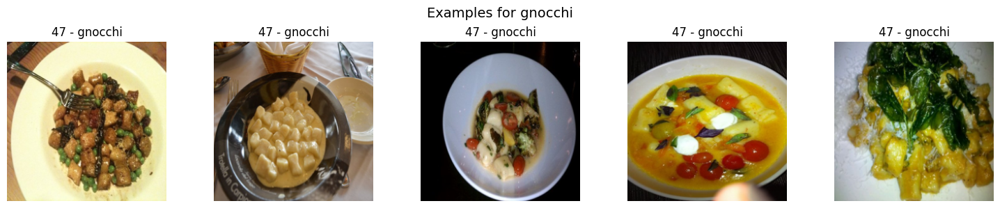

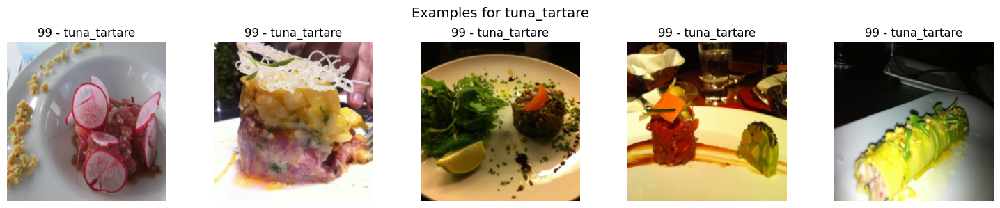

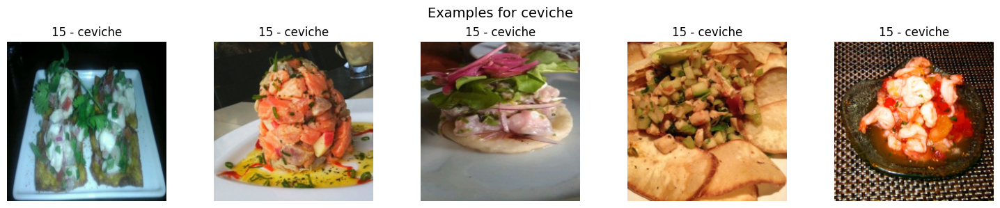

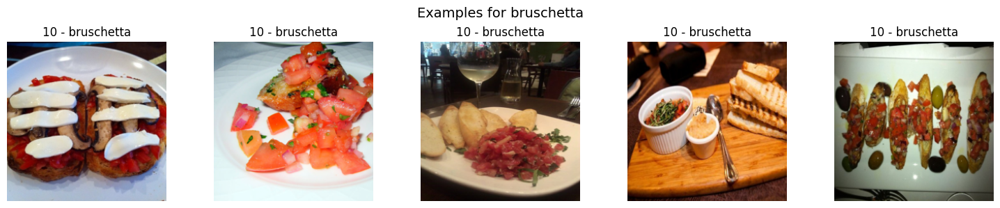

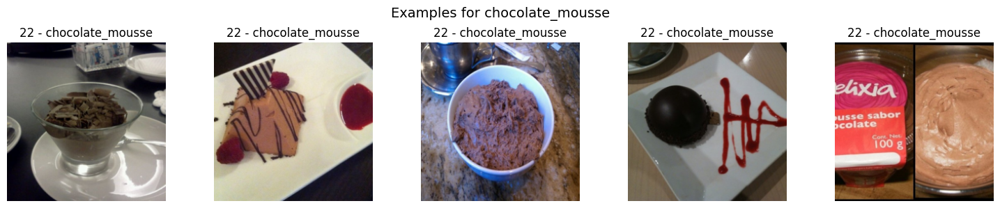

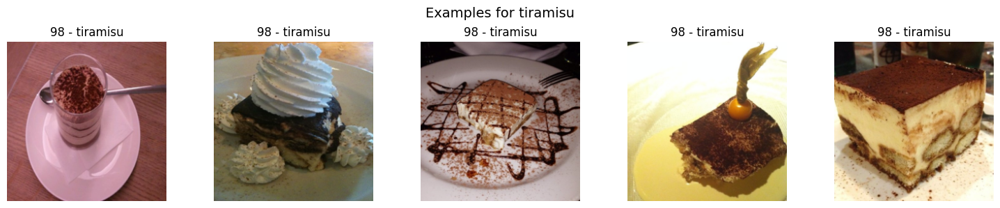

In [ ]:
show_examples(dataset, [82, 47, 99, 15, 10, 22, 98], class_names=class_map)

## This step initializes the recipe generation component by loading the full_dataset.csv into a pandas DataFrame. The preview shows the dataset's structure, which includes essential columns like title, ingredients, and directions that will be used to prompt the Llama model for recipe creation.

In [ ]:
import pandas as pd
import os

extract_path = "dataset/dataset/full_dataset.csv"
df = pd.read_csv(os.path.join(extract_path))
df.head()

,Unnamed: 0,title,ingredients,directions,link,source,NER
0,0,No-Bake Nut Cookies,"[""1 c. firmly packed brown sugar"", ""1/2 c. eva...","[""In a heavy 2-quart saucepan, mix brown sugar...",www.cookbooks.com/Recipe-Details.aspx?id=44874,Gathered,"[""brown sugar"", ""milk"", ""vanilla"", ""nuts"", ""bu..."
1,1,Jewell Ball'S Chicken,"[""1 small jar chipped beef, cut up"", ""4 boned ...","[""Place chipped beef on bottom of baking dish....",www.cookbooks.com/Recipe-Details.aspx?id=699419,Gathered,"[""beef"", ""chicken breasts"", ""cream of mushroom..."
2,2,Creamy Corn,"[""2 (16 oz.) pkg. frozen corn"", ""1 (8 oz.) pkg...","[""In a slow cooker, combine all ingredients. C...",www.cookbooks.com/Recipe-Details.aspx?id=10570,Gathered,"[""frozen corn"", ""cream cheese"", ""butter"", ""gar..."
3,3,Chicken Funny,"[""1 large whole chicken"", ""2 (10 1/2 oz.) cans...","[""Boil and debone chicken."", ""Put bite size pi...",www.cookbooks.com/Recipe-Details.aspx?id=897570,Gathered,"[""chicken"", ""chicken gravy"", ""cream of mushroo..."
4,4,Reeses Cups(Candy),"[""1 c. peanut butter"", ""3/4 c. graham cracker ...","[""Combine first four ingredients and press in ...",www.cookbooks.com/Recipe-Details.aspx?id=659239,Gathered,"[""peanut butter"", ""graham cracker crumbs"", ""bu..."


## This code block performs essential preprocessing by converting the title, ingredients, and directions columns to lowercase and removing any leading or trailing whitespace. These steps ensure consistency across the dataset, making it easier for the Llama model to process text and match ingredients accurately.

In [ ]:
df["title"] = df["title"].str.lower().str.strip()
df["ingredients"] = df["ingredients"].astype(str).str.lower().str.strip()
df["directions"] = df["directions"].astype(str).str.lower().str.strip()

## This code creates a list of target food items from the CNN's classification categories and uses them to filter the recipe DataFrame. By matching the title column against these specific labels, the project isolates only the recipes that correspond to the food items the model is trained to detect.

In [ ]:
wanted_recipes = list(dataset.classes)

pattern = "|".join(dataset.classes)

filtered_df = df[
    df["title"].str.contains(pattern, na=False)
]

## This code block verifies the results of the filtering process, showing that the dataset was narrowed down from over 2.2 million recipes to approximately 137,000 relevant entries. The table provides a preview of the specific titles and cooking directions that will serve as the knowledge base for the Llama model when generating recipes for detected food items.

In [ ]:
print("Total rows:", len(df))
print("Filtered rows:", len(filtered_df))

filtered_df[["title", "directions"]].head(10)

Total rows: 2231142
Filtered rows: 137493


,title,directions
8,nolan's pepper steak,"[""roll steak strips in flour."", ""brown in skil..."
25,smothered round steak(servings: 4),"[""alex patout says, \""smothering is a multipur..."
26,corral barbecued beef steak strips,"[""brown strips in cooking oil."", ""pour off dri..."
32,cherry pizza,"[""grease a 9 x 12-inch cake pan."", ""spread che..."
44,fruit pizza,"[""mix ingredients and spread into 2 greased pi..."
77,spanish hamburgers,"[""brown celery, onions and ground beef in butt..."
100,pancakes,"[""mix dry ingredients."", ""add egg, margarine a..."
127,"corn ""oysters""","[""mix and let stand several hours or overnight..."
157,smoked turkey risotto,"[""in medium-size saucepan, bring the stock to ..."
175,mom's pancakes,"[""sift flour with baking powder, salt and suga..."


## These next few code blocks will prepare the dataframe for additional filtering, using regular expressions

In [ ]:
wanted_keywords = [x.replace("_", " ") for x in wanted_recipes]

In [ ]:
import re

pattern = r"\b(" + "|".join(map(re.escape, wanted_keywords)) + r")\b"

In [ ]:
filtered_df = filtered_df[
    filtered_df["title"].str.contains(pattern, case=False, regex=True, na=False)
]

C:\Users\lidor\AppData\Local\Temp\ipykernel_17232\2443214603.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtered_df["title"].str.contains(pattern, case=False, regex=True, na=False)


In [ ]:
print("After keyword filter:", len(filtered_df))

filtered_df[["title", "directions"]].head(20)

After keyword filter: 137493


,title,directions
8,nolan's pepper steak,"[""roll steak strips in flour."", ""brown in skil..."
25,smothered round steak(servings: 4),"[""alex patout says, \""smothering is a multipur..."
26,corral barbecued beef steak strips,"[""brown strips in cooking oil."", ""pour off dri..."
32,cherry pizza,"[""grease a 9 x 12-inch cake pan."", ""spread che..."
44,fruit pizza,"[""mix ingredients and spread into 2 greased pi..."
77,spanish hamburgers,"[""brown celery, onions and ground beef in butt..."
100,pancakes,"[""mix dry ingredients."", ""add egg, margarine a..."
127,"corn ""oysters""","[""mix and let stand several hours or overnight..."
157,smoked turkey risotto,"[""in medium-size saucepan, bring the stock to ..."
175,mom's pancakes,"[""sift flour with baking powder, salt and suga..."


## This code defines a function to standardize recipe titles by matching them against the project's target food keywords and assigning a corresponding class label. A new label column is created in the DataFrame to facilitate a direct link between the CNN's image predictions and the Llama model's recipe retrieval process.

In [ ]:
wanted_keywords = [x.replace("_", " ") for x in wanted_recipes]

def assign_label(title):
    for kw in wanted_keywords:
        if kw in title:
            return kw.replace(" ", "_")
    return None

filtered_df["label"] = filtered_df["title"].apply(assign_label)

In [ ]:
filtered_df[["title", "label","directions"]].head(20)

,title,label,directions
8,nolan's pepper steak,steak,"[""roll steak strips in flour."", ""brown in skil..."
25,smothered round steak(servings: 4),steak,"[""alex patout says, \""smothering is a multipur..."
26,corral barbecued beef steak strips,steak,"[""brown strips in cooking oil."", ""pour off dri..."
32,cherry pizza,pizza,"[""grease a 9 x 12-inch cake pan."", ""spread che..."
44,fruit pizza,pizza,"[""mix ingredients and spread into 2 greased pi..."
100,pancakes,pancakes,"[""mix dry ingredients."", ""add egg, margarine a..."
127,"corn ""oysters""",oysters,"[""mix and let stand several hours or overnight..."
157,smoked turkey risotto,risotto,"[""in medium-size saucepan, bring the stock to ..."
175,mom's pancakes,pancakes,"[""sift flour with baking powder, salt and suga..."
177,pizza casserole,pizza,"[""brown beef; stir to crumble."", ""drain."", ""pu..."


## This function constructs a specialized prompt for the Llama model, casting it as a professional chef to synthesize the CNN's top three image predictions into a single, cohesive recipe. It organizes the candidate labels and reference cooking styles into a clear template.

In [ ]:
def build_prompt(top3_labels, recipes):
    """
    recipes: list of 3 strings (one per label)
    """

    return f"""
You are a professional chef.

Top dish candidates from an image classifier:
1. {top3_labels[0]}
2. {top3_labels[1]}
3. {top3_labels[2]}

Reference cooking styles (for inspiration only):

[{top3_labels[0]}]
{recipes[0]}

[{top3_labels[1]}]
{recipes[1]}

[{top3_labels[2]}]
{recipes[2]}

Task:
Choose the most likely dish and generate ONE traditional recipe.

Rules:
- Do not copy references
- Do not mention classifier, ranking, or references
- Output only one recipe

Format:
Ingredients:
- item: quantity

Steps:
1. ...
2. ...

Now write the final recipe.

Final Recipe:
"""


## This function extracts sample recipes from the filtered dataset for each of the CNN's top three predicted labels. It cleans the text by removing special characters and formatting the ingredients and directions into a structured string that the Llama model can easily interpret as reference material.

In [ ]:
def fetch_recipes_for_top3(df, top3_labels, k=1):
    """
    df: dataframe with columns ["label", "ingredients", "directions"]
    top3_labels: list of 3 predicted labels
    k: number of example recipes per label

    Returns:
        list of 3 strings (one string per label, containing k example recipes)
    """

    output_recipes = []

    for label in top3_labels:
        subset = df[df["label"] == label]

        # Sample k recipes safely
        examples = subset.sample(min(k, len(subset)), random_state=None)

        recipes_text = []

        for i, (_, row) in enumerate(examples.iterrows(), 1):

            ingredients = row["ingredients"]
            directions = row["directions"]

            recipe_text = f"""
Example Recipe {i}

Ingredients:
{ingredients}

Steps:
{directions}
"""
            recipes_text.append(recipe_text.strip().replace("[", "").replace("]", "").replace("'", "").replace("\"", "").replace(",", ""))

        # Combine all examples for this label into one string
        combined_text = "\n\n".join(recipes_text)

        output_recipes.append(combined_text)

    return output_recipes


## This section executes the retrieval logic for a set of sample predictions (pizza, lasagna, and apple_pie), displaying the raw text extracted from the dataset. The output confirms that the system successfully fetches specific ingredients and numbered cooking steps for each candidate dish, providing the necessary context for the final LLM generation phase.

In [ ]:
top3 = ["pizza", "lasagna", "apple_pie"]

recipes_1, recipes_2, recipes_3 = fetch_recipes_for_top3(filtered_df, top3, k=1)

print(recipes_1, recipes_2, recipes_3, sep="\n\n")

Example Recipe 1

Ingredients:
1 pizza crust (freshly made or commercial 12 to 14 inch) 2 tablespoons olive oil 12 cup chopped onion 1 small italian eggplant peeled and sliced into 1/2-inch thick slices 2 tomatoes cored and chopped 12 cup green beans cut into 1 to 2 inch pieces 10 -15 pitted black olives 2 tablespoons capers drained 1 tablespoon balsamic vinegar 1 tablespoon julienned fresh basil 1 teaspoon fresh thyme (or 1/2 t. dried thyme) 2 cups shredded mozzarella cheese

Steps:
preheat oven to 450; prebake fresh pizza crust if using for 3-4 minutes; remove from oven and set aside to cool slightly. heat the oil in a large skillet over moderate heat; add onion and stir/saute 3-4 minutes until translucent. add in the eggplant; cover and cook 3-4 minutes turning occasionally. add in the tomatoes and green beans; cover and cook 3-4 minutes stirring occasionally. add in the olives capers vinegar basil and thyme; stir and remove from the heat. spread the vegetable mixture over the crust

## These next few code blocks were used to set up the llama model, the token was redacted for privacy reasons.

In [ ]:
from huggingface_hub import login

# You can just paste the string here, but BE CAREFUL not to share this!
login(token="REDACTED")

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

# 2. Setup 4-bit quantization (Essential for Colab's T4 GPU)
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.float16,
)

# 3. Set the specific Model ID you were approved for
model_id = "meta-llama/Llama-2-7b-hf"

hf_token = "REDACTED"

# Load the Tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_id, token=hf_token)

# Load the Model
llama_model = AutoModelForCausalLM.from_pretrained(
    model_id,
    quantization_config=bnb_config,
    device_map={ "": 0 }, # Changed from "auto" to explicitly load all to GPU 0
    token=hf_token
)

Loading weights:   0%|          | 0/291 [00:00<?, ?it/s]

## This function integrates the classification results with the Llama model by retrieving reference recipes and constructing a structured prompt. It then configures the model's generation parameters, such as temperature and top_p, to produce a creative yet coherent final recipe based on the identified food items.

In [ ]:
def generate_recipe(top3, max_new_tokens=200):
    recipes = fetch_recipes_for_top3(filtered_df, top3, k=3)
    prompt = build_prompt(top3, recipes)

    inputs = tokenizer(prompt, return_tensors="pt").to(llama_model.device)

    outputs = llama_model.generate(
        **inputs,
        max_new_tokens=max_new_tokens,
        do_sample=True,
        temperature=0.7,
        top_p=0.9,
        repetition_penalty=1.1,
        eos_token_id=tokenizer.eos_token_id,
        pad_token_id=tokenizer.eos_token_id
    )

    text = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return text[len(prompt):]

## This code block executes the Llama model on a random output, however, we can see from the output the model is not working correctly, and needs tampering.

In [ ]:
top3 = ["pizza", "hamburger", "apple_pie"]

print("Output - ", sep='\n')
out = generate_recipe(top3)
print(out)

Output - 

You are a professional chef.

Top dish candidates from an image classifier:
1. pizza
2. hamburger
3. apple_pie

Reference cooking styles (for inspiration only):

[pizza]
Example Recipe 1

Ingredients:
1 puff pastry sheet (from one 17 1/4-ounce package frozen puff pastry sheets) thawed 1/2 pound broccoli rabe 1/3 cup drained kalamata or other brine-cured black olives 2 garlic cloves 1 tablespoon fresh lemon juice 6 ounces smoked mozzarella 1 tablespoon extra-virgin olive oil

Steps:
line a baking sheet with parchment paper. on a lightly floured surface unfold pastry sheet and gently roll out to a 14- by 12-inch rectangle. transfer pastry to baking sheet and prick all over with a fork. chill pastry covered at least 30 minutes and up to 1 day. preheat oven to 400f. have ready a bowl of ice and cold water. trim 1 inch from bottoms of broccoli rabe stems. in a saucepan of boiling salted water blanch broccoli rabe 30 seconds and transfer with tongs to ice water to stop cooking. dr

## This code defines an updated prompt engineering strategy that assigns the Llama model the persona of an expert chef and enforces stricter output constraints. The template prioritizes a concise, professional synthesis of the reference recipes into a single traditional version, utilizing clear headers and short phrases while explicitly forbidding conversational filler or mention of the classification process.

In [ ]:
def build_prompt(top3_labels, recipes):
    prompt = f"""
### Instruction:
You are an expert chef. Below are the top 3 likely dishes identified by an image classifier and reference recipes for each.
Your task is to choose the MOST likely dish and generate one clear, TRADITIONAL recipe for it.

### Reference Data:
Dishes: {', '.join(top3_labels)}

Reference Recipe for {top3_labels[0]}:
{recipes[0]}

Reference Recipe for {top3_labels[1]}:
{recipes[1]}

Reference Recipe for {top3_labels[2]}:
{recipes[2]}

### Rules:
1. Output ONLY the recipe for the single most likely dish.
2. Structure the output strictly with "Ingredients:" and "Steps:" headers.
3. Do not include conversational filler or mention uncertainty.
4. Be extremely concise. Use short phrases, not full sentences.
5. If reference recipes are messy, synthesize them into a clean, professional version.

### Recipe:
"""
    return prompt

## This revised function optimizes the retrieval process by stripping away conversational text and formatting ingredients and directions into clean, bulleted lists. By adopting a minimal schema—Label, Ing, and Steps—it provides the Llama model with a dense, noise-free reference for more accurate recipe synthesis, and to save on tokens.

In [ ]:
device = "cuda"
def fetch_recipes_for_top3(df, top3_labels, k=1):
    output_recipes = []

    for label in top3_labels:
        subset = df[df["label"] == label]
        examples = subset.sample(min(k, len(subset)))

        recipes_text = []
        for _, row in examples.iterrows():
            # 1. Clean and convert string-lists to simple lines
            # This turns "['salt', 'pepper']" into "salt\npepper"
            def clean_list(text):
                items = text.replace("[", "").replace("]", "").replace("'", "").replace('"', "").split(",")
                return "\n".join([f"- {i.strip()}" for i in items if i.strip()])

            ing = clean_list(str(row["ingredients"]))
            dir = clean_list(str(row["directions"]))

            # 2. Use a minimal schema: Label -> Ingredients -> Steps
            # No extra words like "Example Recipe", just the core data
            recipe_text = f"Label: {label}\nIng:\n{ing}\nSteps:\n{dir}"
            recipes_text.append(recipe_text)

        output_recipes.append("\n---\n".join(recipes_text))

    return output_recipes

## This code block configures the generate_recipe function with a low temperature of 0.1 to ensure highly focused and deterministic recipe outputs. It utilizes the updated retrieval and prompt-building logic to generate a concise, professional recipe based on the image classifier's top three candidates.

In [ ]:
def generate_recipe(top3, max_new_tokens=1024):
    recipes = fetch_recipes_for_top3(filtered_df, top3, k=1)
    prompt = build_prompt(top3, recipes)

    inputs = tokenizer(prompt, return_tensors="pt").to(llama_model.device)

    outputs = llama_model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            do_sample=True,
            temperature=0.1,
            top_p=0.9,
            repetition_penalty=1.1,
            eos_token_id=tokenizer.eos_token_id,
            pad_token_id=tokenizer.eos_token_id
    )

    text = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return text[len(prompt):]

## This code block runs another test on the model, we can see that the output is a functional taco recipe, in accordance with the top3 list.

In [ ]:
top3 = ["tacos", "breakfast_burrito", "huevos_rancheros"]

print("Output - ", sep='\n')
out = generate_recipe(top3)
print(out)

Output - 
```
Ing:
- 1 pound firm white fish fillet
- cut into 1 1/2-inch pieces
- 1 (12-ounce) bottle mexican beer
- 1 tablespoon mexican seasoning*
- vegetable oil
- 1 cup all-purpose flour
- 1 teaspoon salt
- 1 teaspoon sugar
- 1/2 teaspoon baking powder
- 1 cup mexican beer
- 1/2 teaspoon hot sauce
- 12 fresh corn tortillas
- warmed
- 1 lime
- cut into wedges
- 3/4 cup shredded queso blanco or monterey jack cheese
- 3 cups shredded green cabbage
- 1/2 red onion
- cut into strips (about 1/2 cup)
Steps:
- place fish in a large heavy-duty zip-top plastic bag. combine 12 ounces beer and mexican seasoning in a bowl
- stirring well. pour beer mixture over fish; seal. chill 2 to 3 hours.
- pour oil to depth of 1 1/2 inches into a deep skillet or dutch oven; heat to 360\u00b0.
- combine flour and next 3 ingredients in a medium bowl. whisk in 1 cup beer and hot sauce. drain fish
- discarding marinade. coat fish in batter.
- cook fish in batches about 4 minutes or until done. drain on paper 

## This code block demonstrates another test on the model.

In [ ]:
top3 = ["seaweed_salad", "bibimbap", "gyoza"]

print("Output - ", sep='\n')
out = generate_recipe(top3)
print(out)

Output - 
```
Ing:
- 2 large tuna steak
- 1 packages premade sea weed salad
- 1 packages soba noodles
- 1/4 cup soy sauce
- 2 tbsp honey
- 3 clove garlic cloves minced
- 2 tbsp rice vinegar
- 2 tsp sesame oil
- 1/3 cup olive oil
- 1/4 cup green onion chopped
- 2 slice grated ginger
- 1 tbsp black sesame seeds
- 1 tbsp white sesame seeds
- 1 dash onion powder
- 1 dash ground black pepper
- 1 dash salt
Steps:
- cook soba noodles as directed
- in a small bowl
- combine soy sauce
- honey
- rice vinegar
- sesame oil
- garlic
- and olive oil.
- mix well.
- on a plate
- combine black & white sesame seeds
- garlic powder
- salt
- and pepper.
- spread evenly.
- heat skillet on high with tablespoon of oil.
- press tuna steaks onto plate mixture on each side.
- sear tuna steaks on hot pan for 1 minute each side.
- combine sauce with cold soba noodles.
- toss with chopped onion and ginger.
- plate seaweed salad evenly on top of noodles.
- cut cooked tuna steaks into slices and plate on top of seaw

## This code block initializes the project's dual-model pipeline by configuring a ResNet50 CNN for food image classification and loading a 4-bit quantized Llama-2-7b model for recipe generation. The CNN is updated with a custom classifier head and pre-trained weights, while the Llama model is optimized for GPU memory efficiency using BitsAndBytesConfig.

In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 101
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

def build_model():
    # 1. Build CNN model
    cnn_model = models.resnet50(pretrained=True)

    # Replace FC with the modified version
    modified_classifier = nn.Sequential(
        nn.Dropout(0.4),
        nn.Linear(cnn_model.fc.in_features, num_classes)
    ).to(device)

    # Attach the modified layer to ResNet
    cnn_model.fc = modified_classifier

    # Load the models weights and move to device
    cnn_model.load_state_dict(torch.load("final_CNN_model_weights.pth", map_location=device))
    cnn_model = cnn_model.to(device)

    # Ensure model is in eval mode
    cnn_model.eval()

    # 2. Build Llama model and tokenizer
    bnb_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_compute_dtype=torch.float16,
    )
    model_id = "meta-llama/Llama-2-7b-hf"
    hf_token = "insert hugging face token"

    # Load the Tokenizer
    tokenizer = AutoTokenizer.from_pretrained(model_id, token=hf_token)

    # Load the Model
    llama_model = AutoModelForCausalLM.from_pretrained(
        model_id,
        quantization_config=bnb_config,
        device_map={ "": 0 }, # Changed from "auto" to explicitly load all to GPU 0
        token=hf_token
    )

    return cnn_model, llama_model, tokenizer

## This function encapsulates the entire multimodal workflow by transforming a raw input image into a professional recipe. It passes the image through the ResNet50 CNN to identify the top three food candidates, then feeds those labels into the Llama generation logic to produce the final culinary instructions.

In [ ]:
from PIL import Image

def image_to_recipe_pipeline(image_path, cnn_model, dataset, device, topk=3):
    """
    Complete pipeline: Image -> CNN -> Top 3 Labels -> Llama Prompt -> Recipe
    """
    cnn_model.eval()

    # 1. Load and Preprocess the image
    # Note: Use the 'base_transform' you defined earlier in the notebook
    img = Image.open(image_path).convert('RGB')
    input_tensor = base_transform(img).unsqueeze(0).to(device)

    # 2. Get CNN Predictions
    with torch.no_grad():
        outputs = cnn_model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probs, topk)

    # 3. Map indices to Class Names
    # Handling the case where the dataset might be a 'Subset'
    if isinstance(dataset, torch.utils.data.Subset):
        class_names = dataset.dataset.classes
    else:
        class_names = dataset.classes

    top3_labels = [class_names[i] for i in top_indices[0].cpu().numpy()]
    print(f"CNN Predictions: {top3_labels}")

    recipe = generate_recipe(top3_labels)

    return recipe, top3_labels

## This function selects a random image from the test subset to showcase the final system in action, comparing the CNN's top-3 predictions against the actual ground truth label. It displays the food image alongside the chef-style recipe generated by the Llama model, providing a complete visual and textual validation of the multimodal project.

In [ ]:
def run_random_mre_demo(cnn_model, test_subset, device):
    # 1. Get a random image path from the dataset
    # test_subset is a Subset, so we look at the original dataset samples
    random_idx = random.randint(0, len(test_subset) - 1)
    actual_idx = test_subset.indices[random_idx]
    image_path, true_label_idx = test_subset.dataset.samples[actual_idx]

    # 2. Run the pipeline to get the recipe
    recipe, top3_labels = image_to_recipe_pipeline(
        image_path, cnn_model, test_subset, device
    )

    # Visuals
    plt.figure(figsize=(6, 6))
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(f"CNN Prediction: {', '.join(top3_labels)}\nActual: {test_subset.dataset.classes[true_label_idx]}")
    plt.show()

    print(f"\n{'='*20} GENERATED RECIPE {'='*20}\n")
    print(recipe)

In [ ]:
cnn_model, llama_model, tokenizer = build_model()

c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lidor\miniconda3\envs\torch_gpu\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading weights:   0%|          | 0/291 [00:00<?, ?it/s]

## Here we execute the model on a random image on the test dataset. As we can see, the CNN model accuratly identifies the food item, and the Llama model can create an appropriate recipe.

CNN Predictions: ['miso_soup', 'clam_chowder', 'edamame']


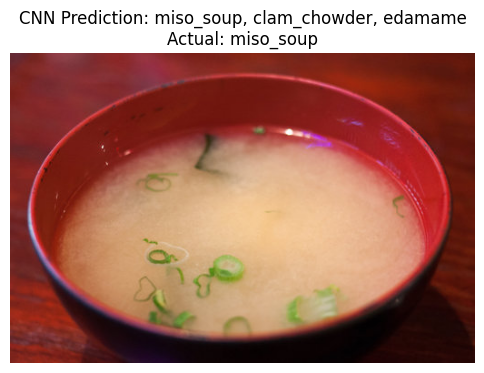


==================== GENERATED RECIPE ====================

```
Ing:
- 2 tsp miso
- 1 tbsp mentsuyu (3x concentrate)
- 1 tsp chicken soup stock granules
- 1/4 tsp sugar
- 1/4 tsp ginger (grated)
- 1/4 tsp garlic (grated)
- 1 dash ra-yu or regular sesame oil
- 200 ml hot water
Steps:
- put all the ingredients except for the hot water in a ramen bowl and mix well.
- add the hot water little by little while mixing to dissolve.
- the soup is done.
- if you put the cooked noodles in the bowl with the soup
- you have miso ramen.
- enjoy with toppings of your choice.
```



In [ ]:
run_random_mre_demo(cnn_model, test_dataset, device)

## However, this is not always the case, from the result of this code block we can see that the CNN model accuratly detects the food item. Llama accuratly creates a recipe containing foie gras. However, the recipe itself is not for foie gras, it just contains it as an ingredient.

CNN Predictions: ['foie_gras', 'grilled_salmon', 'scallops']


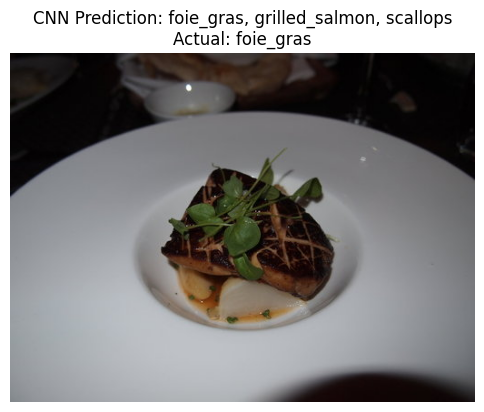


==================== GENERATED RECIPE ====================

```
Ingredients:
- 3 tablespoons unsalted butter
- 2 thick slices of lean bacon
- finely chopped
- 1 small carrot
- thinly sliced
- 1/2 small white onion
- finely chopped
- 1/2 cup brown lentils
- 2 cups water
- 1/3 cup plus 1 1/2 tablespoons all-purpose flour
- 1/3 cup plus 1 1/2 tablespoons freshly grated parmigiano-reggiano cheese
- 1 large egg
- beaten
- 1 large egg yolk
- 1/2 teaspoon salt
- 1/4 teaspoon freshly ground pepper
- 1/2 small red onion
- cut into thin wedges
- 1 tablespoon white balsamic vinegar
- 1/3 cup ruby port
- 1 cup chicken stock or low-sodium broth
- one 3-ounce slice of pure foie gras pate
- cut into 1-inch cubes
- salt and freshly ground pepper
- aged balsamic vinegar
- for drizzling
Steps:
- in a medium saucepan
- melt 1 tablespoon of the butter.
- add the bacon
- carrot and onion and cook over moderate heat
- stirring
- until the onion is softened
- about 4 minutes.
- add the lentils and water
- c

In [ ]:
run_random_mre_demo(cnn_model, test_dataset, device)

## From the head of the dataframe we can clearly see some recipes are "fusions" or personal interpertations of our desired food items, we will attempt to filter out these recipes by removing any one that is "trendy" or is non-traditional.

In [ ]:
def filter_traditional_recipes(df, class_list):
    """
    Filters the dataframe to keep only 'traditional' recipes by:
    1. Ensuring the label is present in the title.
    2. Removing 'Fusion' recipes (titles containing more than one class name).
    3. Removing 'Shortcut' recipes (e.g., mock, easy, quick, microwavable).
    """

    # Pre-clean classes for comparison (lowercase and replace underscores)
    clean_classes = [c.lower().replace("_", " ") for c in class_list]

    def check_traditionality(row):
        title = str(row['title']).lower()
        label = str(row['label']).lower().replace("_", " ")

        # Rule 1: The label MUST be in the title
        # (prevents a 'Steak' label getting a recipe titled 'Garlic Butter')
        if label not in title:
            return False

        # Rule 2: No Fusion!
        # If the title contains ANY OTHER class name, exclude it.
        # Example: If label is 'hamburger', title 'Pizza Burger' is rejected.
        for other_class in clean_classes:
            if other_class != label and other_class in title:
                return False

        # Rule 3: No Shortcuts/Non-traditional methods
        forbidden_keywords = [
            'mock', 'easy', 'quick', 'shortcut', 'simple',
            'microwave', 'fake', 'imitation', 'style', 'inspired',
            'foam', 'emulsion', 'sous vide', 'deconstructed', 'infused',
            'gel', 'powder', 'air', 'molecular', 'fusion', 'reinterpret',
            'truffle oil', 'microgreens', 'balsamic reduction', 'port reduction',
            'healthy', 'low-carb', 'low carb', 'keto', 'gluten-free', 'gluten free',
            'weeknight', '30-minute', '30 minute', 'twist', 'modern', 'elevated',
            'fruit', 'fun', 'vegan', 'kids', 'dessert', 'sweet', 'summer', 'party'
        ]
        if any(word in title for word in forbidden_keywords):
            return False

        return True

    # Apply the filter
    traditional_df = df[df.apply(check_traditionality, axis=1)].copy()

    print(f"Remaining recipes: {len(traditional_df)}")

    return traditional_df

In [ ]:
# The recipe dataframe is filled with non-traditional recipes which cause the model to generate strange recipes
prefilter_df = filtered_df
class_names = dataset.classes
filtered_df = filter_traditional_recipes(filtered_df, class_names)

Remaining recipes: 113964


## From the head of the dataframe after filtering, we can see that there are still recipes that confuse the model, such as the "cherry pizza" recipe. Still, we removed a significant amount of recipes that would interfere with the models ability to generate a classic recipe.

In [ ]:
print(f"Size after filtering: {len(filtered_df)}")
filtered_df.head()

Size after filtering: 113964


,Unnamed: 0,title,ingredients,directions,link,source,NER,label
8,8,nolan's pepper steak,"[""1 1/2 lb. round steak (1-inch thick), cut in...","[""roll steak strips in flour."", ""brown in skil...",www.cookbooks.com/Recipe-Details.aspx?id=375254,Gathered,"[""tomatoes"", ""water"", ""onions"", ""Worcestershir...",steak
25,25,smothered round steak(servings: 4),"[""2 lb. round steak"", ""1/2 tsp. ground black p...","[""alex patout says, \""smothering is a multipur...",www.cookbooks.com/Recipe-Details.aspx?id=982859,Gathered,"[""steak"", ""ground black pepper"", ""ground white...",steak
26,26,corral barbecued beef steak strips,"[""2 lb. round steak 1/2 to 3/4-inch thick, sli...","[""brown strips in cooking oil."", ""pour off dri...",www.cookbooks.com/Recipe-Details.aspx?id=420402,Gathered,"[""long"", ""cooking oil"", ""tomato sauce"", ""water...",steak
32,32,cherry pizza,"[""2 cans cherry pie mix"", ""1 box deluxe white ...","[""grease a 9 x 12-inch cake pan."", ""spread che...",www.cookbooks.com/Recipe-Details.aspx?id=1072589,Gathered,"[""cherry pie mix"", ""deluxe white cake mix"", ""b...",pizza
100,100,pancakes,"[""1 c. flour"", ""1 tsp. soda"", ""1 tsp. salt"", ""...","[""mix dry ingredients."", ""add egg, margarine a...",www.cookbooks.com/Recipe-Details.aspx?id=57556,Gathered,"[""flour"", ""soda"", ""salt"", ""sugar"", ""egg"", ""mar...",pancakes


## This code block attempts another run of the multimodal, this time the result is more satisfactory, resulting in a recipe for the actual dish.

CNN Predictions: ['paella', 'pulled_pork_sandwich', 'beef_carpaccio']


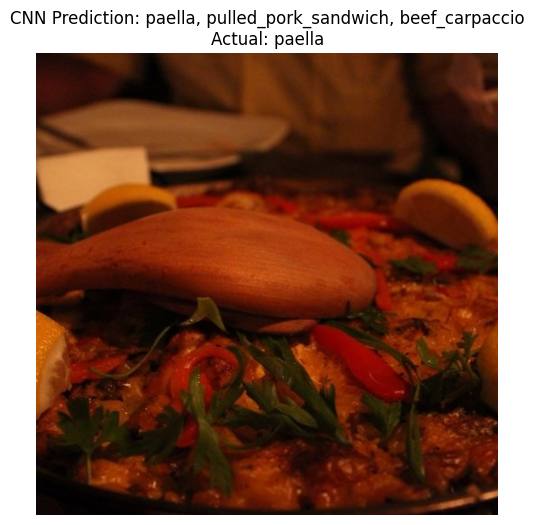


==================== GENERATED RECIPE ====================

```
Ingredients:
- 3 lbs boneless skinless chicken breasts or 3 lbs boneless skinless chicken thighs
- 2 -3 lbs pork tenderloin
- 1/2 cup olive oil
- 1 large onion
- peeled and diced
- 6 medium tomatoes
- diced
- 2 bell peppers
- diced
- 2 tablespoons mexican saffron
- 3 cups regular uncooked rice
- 4 cups low-fat chicken broth
- 4 cups water
- 3 tablespoons paprika
- 2 tablespoons salt
- 1 1/2 teaspoons fresh ground pepper
- 1/2 teaspoon cayenne pepper
- 1 (10 ounce) package frozen baby peas
- unthawed
- 1 (15 ounce) jar artichoke hearts
- drained and halved
- 1 (8 ounce) jar sliced pimientos
- drained
- 12 ounces shrimp
- peeled and deveined (optional)
- 1 lb fish
- cut into bite-sized pieces (any kind of white fish) (optional)
Steps:
- cut the chicken pieces and the pork into bite-sized pieces.
- heat olive oil in a heavy kettle or dutch oven over medium high heat and brown chicken and pork in small batches; remove from ke

In [ ]:
run_random_mre_demo(cnn_model, test_dataset, device)

In [ ]:
filtered_df.to_csv("filtered_recipes.csv", index=False)

## This code block modifies the image to recipe pipeline to no longer require the dataset.

In [ ]:
from PIL import Image

def image_to_recipe_pipeline(image_path, cnn_model, class_names, device, topk=3):
    """
    Complete pipeline: Image -> CNN -> Top 3 Labels -> Llama Prompt -> Recipe
    """
    cnn_model.eval()

    # 1. Load and Preprocess the image
    # Note: Use the 'base_transform' you defined earlier in the notebook
    img = Image.open(image_path).convert('RGB')
    input_tensor = base_transform(img).unsqueeze(0).to(device)

    # 2. Get CNN Predictions
    with torch.no_grad():
        outputs = cnn_model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probs, topk)

    top3_labels = [class_names[i] for i in top_indices[0].cpu().numpy()]
    print(f"CNN Predictions: {top3_labels}")

    recipe = generate_recipe(top3_labels)

    return recipe, top3_labels

## This code block generates a recipe on any image, this allows the general use of the model.

In [ ]:
def run_mre(cnn_model, image_path, device):

    # Run the pipeline to get the recipe
    recipe, top3_labels = image_to_recipe_pipeline(
        image_path, cnn_model, class_names, device
    )

    # Visuals
    plt.figure(figsize=(6, 6))
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.title(f"CNN Prediction: {', '.join(top3_labels)}")
    plt.show()

    print(f"\n{'='*20} GENERATED RECIPE {'='*20}\n")
    print(recipe)

## The following code blocks run the model on a few dishs I made, we can see that the CNN model accuratly detects the food items, and the Llama model creates a simple recipe appropriate for the dish.

CNN Predictions: ['pancakes', 'creme_brulee', 'cheesecake']


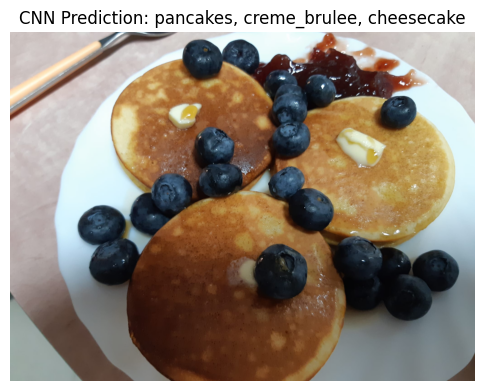


==================== GENERATED RECIPE ====================

```
Ingredients:
- 2 eggs
- 2 c. flour
- 1 1/2 c. milk
- 3 tbsp. sugar
- 1 1/2 tbsp. baking powder
- 2 tbsp. canola oil or veggie oil

Steps:
- beat eggs until fluffy in medium size mixing bowls.
- add flour
- sugar
- baking powder
- milk and oil.
- mix until well blended.
- fry in large skillet
- lightly oiled.
```



In [ ]:
run_mre(cnn_model, "test_image1.jpg", device)

CNN Predictions: ['french_toast', 'garlic_bread', 'onion_rings']


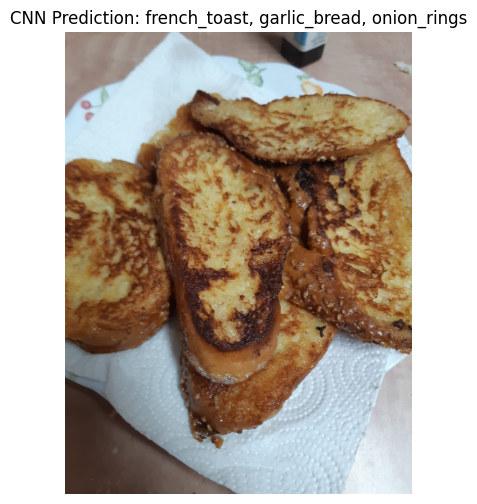


==================== GENERATED RECIPE ====================

```
Ingredients:
- Eggs
- Milk
- Butter
- Salt
- Pepper

Steps:
- Beat eggs and milk together in a bowl.
- Add butter and salt and pepper to taste.
- Pour mixture over bread slices.
- Bake at 350 degrees Fahrenheit until golden brown.
```



In [ ]:
run_mre(cnn_model, "test_image2.jpg", device)

CNN Predictions: ['falafel', 'hummus', 'carrot_cake']


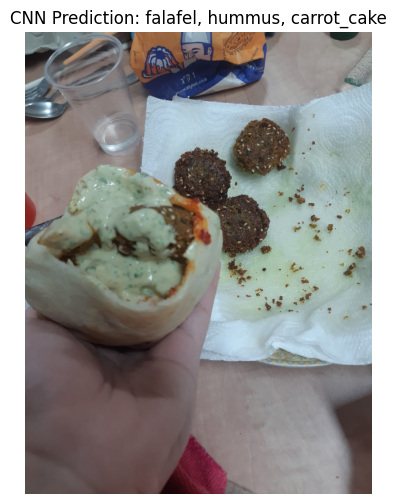


==================== GENERATED RECIPE ====================

```
Ingredients:
- tahini-yogurt sauce:
- 1/3 cup plain low-fat yogurt
- 2 tablespoons tahini (roasted sesame seed paste)
- 2 tablespoons cold water
- 1 tablespoon fresh lemon juice
- 1/4 teaspoon salt
- 1/4 teaspoon freshly ground black pepper
- falafel:
- 1 1/3 cups boiling water
- 2/3 cup uncooked bulgur
- 2 garlic cloves
- 1/3 cup fresh parsley leaves
- 1/4 cup fresh cilantro leaves
- 3/4 teaspoon ground cumin
- 1/4 teaspoon salt
- 1/4 teaspoon ground red pepper
- 1 (15-ounce) can chickpeas (garbanzo beans)
- rinsed and drained
- 1 large egg white
- 3 tablespoons olive oil
- divided
- 2 (6-inch) whole-wheat pitas
- halved crosswise
- 1 cup chopped tomato (1 medium tomato)
- 1/2 cup thinly sliced english cucumber
- 1/3 cup thinly sliced red onion
Steps:
- to prepare tahini-yogurt sauce
- combine first 6 ingredients in a small bowl. cover and chill until ready to serve.
- to prepare falafel
- combine 1 1/3 cups boiling wate

In [ ]:
run_mre(cnn_model, "test_image3.jpg", device)